
# Modelos Avanzados de Analisis de datos

 <img src="http://usblogs.pwc.com/emerging-technology/wp-content/uploads/2017/07/deep-learning-900x280.png" >

## Proyecto 1

### Modelo predictivo para Start-Up Agricola

### Deep Learning Course


Desarrollado por [Sergio Castelblanco](http://www.linkedin.com/in/sergio-castelblanco/), Jose Sandoval, Aleksey Sepulveda

Universidad de los Andes

version 2.0 , Agosto 4 2018

<h1> <center> Contenido </h1> </center> 


|                   Topics: |
|------|
| Descripcion del Problema |
| Analisis exploratorio |
| enfoque metodologico|
| Transformacion de Datos |
| Modelamiento Predictivo |
| Analisis de resultados |
| Conclusiones |

# Analisis Exploratorio

### Descripción del problema
Una start-up agricola quiere construir una aplicacion online que conecte el campo con la ciudad de manera directa y sin intermediarios. De esta manera, los agricultores ponen a la disposicion de la empresa sus distintos productos, y la start-up se encarga de atender las necesidades de demanda distribuyendo los productos hasta los clientes ﬁnales en la ciudad. Para optimizar la gestion logıstica y desarrollar esta labor de manera eﬁciente, los dueños de la start-up han visto la necesidad de diseñar e implementar un `sistema de gestion y prediccion` que les permita planear con la debida anticipacion la demanda esperada. Ası podrıan coordinar las actividades de produccion, junto con los agricultores, y atender la demanda mientras se minimizan las perdidas por unidades de producto no vendido o estropeado. Por lo tanto, la start-up agrıcola debe gestionar los inventarios de manera inteligente, disminuyendo la ventana de tiempo entre cosecha y consumo. Para ello, necesita desarrollar `modelos de prediccion` de demanda que apoyen su operacion, logrando la disponibilidad de los productos para atender a los clientes del dia siguiente, minimizando los desperdicios de alimentos e identiﬁcando habitos de consumo que le permita `optimizar` sus operaciones logısticas y de negocio.

Dicho lo anterior se debe plantear un modelo predictivo de `precio` y `demanda` para `121 productos`.

<h1> <center> Analisis Exploratorio </h1> </center> 


|                   Topics: |
|------|
| Definicion del Dataset|
| Informacion general del Dataset |
| Identificacion de valores faltantes |
| Analisis Descriptivo |
| Imputacion de datos |
| Analisis Grafico |
| Outliers Analysis |
| Analisis de Pareto |
| Series de Tiempo de Productos Pareto |
| Analisis no Supervisado - Clustering |

### Cargando Datos a Colab

In [1]:
!pip3 install xlrd
!pip3 install missingno
!pip3 install plotly
!pip3 install livelossplot
!apt install python-pydot python-pydot-ng graphviz
!pip install -q pydot
!pip3 install graphviz

In [0]:

import os

if not os.path.exists('base de datos full.xlsx'):
  # Install the PyDrive wrapper & import libraries.
  # This only needs to be done once per notebook.
  !pip install -U -q PyDrive
  from pydrive.auth import GoogleAuth
  from pydrive.drive import GoogleDrive
  from google.colab import auth
  from oauth2client.client import GoogleCredentials

  # Authenticate and create the PyDrive client.
  # This only needs to be done once per notebook.
  auth.authenticate_user()
  gauth = GoogleAuth()
  gauth.credentials = GoogleCredentials.get_application_default()
  drive = GoogleDrive(gauth)

  # Download a file
  #
  # A file ID looks like: laggVyWshwcyP6kEI-y_W3P8D26sz
  file_id = '14HfE7WTmogPHr3ZDuLz3gZbjHaaF8nTr'
  downloaded = drive.CreateFile({'id': file_id})
  downloaded.GetContentFile(downloaded['title'])
  
  # A file ID looks like: laggVyWshwcyP6kEI-y_W3P8D26sz
  file_id = '1GEq-3BvGu4DPOI_JHml4XLxt7rR1yTGG'
  downloaded = drive.CreateFile({'id': file_id})
  downloaded.GetContentFile(downloaded['title'])
  
   # A file ID looks like: laggVyWshwcyP6kEI-y_W3P8D26sz
  file_id = '1_LYYLiIaKzfeYpa_49L9OcpIBdFXI7GR'
  downloaded = drive.CreateFile({'id': file_id})
  downloaded.GetContentFile(downloaded['title'])
  
   # A file ID looks like: laggVyWshwcyP6kEI-y_W3P8D26sz
  file_id = '1x3X4WVcn6RgWID_5ldsdq6Nve9v-1GAV'
  downloaded = drive.CreateFile({'id': file_id})
  downloaded.GetContentFile(downloaded['title'])
  
   # A file ID looks like: laggVyWshwcyP6kEI-y_W3P8D26sz
  file_id = '1UIw82yc7Frpy7Ft5kUYFdytZTRl6K-0W'
  downloaded = drive.CreateFile({'id': file_id})
  downloaded.GetContentFile(downloaded['title'])
  
    # A file ID looks like: laggVyWshwcyP6kEI-y_W3P8D26sz
  file_id = '1a4UOSasYAs1FESfhVH4HKMGiTEwNc0lp'
  downloaded = drive.CreateFile({'id': file_id})
  downloaded.GetContentFile(downloaded['title'])
  
    # A file ID looks like: laggVyWshwcyP6kEI-y_W3P8D26sz
  file_id = '1ikEutetlL2B9BXLZ7ltu7ieFaRcF3Kf4'
  downloaded = drive.CreateFile({'id': file_id})
  downloaded.GetContentFile(downloaded['title'])
 

In [3]:
!ls

adc.json	   DatosAgro.txt	precio_impute0918.xlsx
data_Ingreso.xlsx  Final Dataset2.xlsx	precio_impute0925.xlsx
data_Pedido.xlsx   Final Dataset.xlsx	sample_data


### Definicion del Dataset

In [4]:
os.getcwd()

'/content'

In [0]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns
plt.style.use('ggplot')

In [22]:
data = pd.read_csv("DatosAgro.txt", delimiter="\t",sep=" ", usecols=[0,1,2,3,4,5]) 
data.head(15)

,Cliente,Fecha,Pedido,Precio,Producto,Nombre_producto
0,Cliente26,18/09/2017,20,700,VER0049,Yerbabuena / 100 gramos
1,Cliente26,18/09/2017,10,1200,FRU0024,Limón Tahití / Libra
2,Cliente26,18/09/2017,4,1600,VER0041,Puerro / Libra
3,Cliente26,18/09/2017,10,1500,VER0038,Pimentón Rojo / Libra
4,Cliente26,18/09/2017,8,1100,VER0010,Zucchini Verde / Libra
5,Cliente26,18/09/2017,30,1000,VER0052,Plátano Maduro / Libra
6,Cliente26,18/09/2017,24,1000,TUB0012,Zanahoria / Libra
7,Cliente3,18/09/2017,1,4500,VER0050,Rúgula / Libra
8,Cliente3,18/09/2017,1,3500,VER0043,Repollo Morado / Unidad
9,Cliente3,18/09/2017,2,1500,VER0038,Pimentón Rojo / Libra


Se procede a dividir el nombre del producto y la cantidad que se encuentran en una misma columna para aprovechar al maximo la informacion del Dataset que pueda ser util para la identificacion de patrones en el modelo predictivo.

In [23]:
data["Nombre_producto"],data["Cantidad"] = data["Nombre_producto"].str.split("/",1).str
data.head()

,Cliente,Fecha,Pedido,Precio,Producto,Nombre_producto,Cantidad
0,Cliente26,18/09/2017,20,700,VER0049,Yerbabuena,100 gramos
1,Cliente26,18/09/2017,10,1200,FRU0024,Limón Tahití,Libra
2,Cliente26,18/09/2017,4,1600,VER0041,Puerro,Libra
3,Cliente26,18/09/2017,10,1500,VER0038,Pimentón Rojo,Libra
4,Cliente26,18/09/2017,8,1100,VER0010,Zucchini Verde,Libra


Se procede a dividir el tipo de producto y su codigo que se encuentran en una misma columna para aprovechar al maximo la informacion del Dataset que pueda ser util para la identificacion de patrones en el modelo predictivo.

In [24]:
data["Tipo_Prod"],data["Cod"] = data["Producto"].str.split("0",1).str
data.head()

,Cliente,Fecha,Pedido,Precio,Producto,Nombre_producto,Cantidad,Tipo_Prod,Cod
0,Cliente26,18/09/2017,20,700,VER0049,Yerbabuena,100 gramos,VER,049
1,Cliente26,18/09/2017,10,1200,FRU0024,Limón Tahití,Libra,FRU,024
2,Cliente26,18/09/2017,4,1600,VER0041,Puerro,Libra,VER,041
3,Cliente26,18/09/2017,10,1500,VER0038,Pimentón Rojo,Libra,VER,038
4,Cliente26,18/09/2017,8,1100,VER0010,Zucchini Verde,Libra,VER,010


Se procede a dividir la fecha para separar el dia, mes y año en columnas diferentes con el objetivo de aprovechar al maximo la informacion del Dataset que pueda ser util para la identificacion de patrones en el modelo predictivo.

In [0]:
data["Dia"],data["Mes"],data["Año"] = data["Fecha"].str.split("/",2).str

In [26]:
data.head()

,Cliente,Fecha,Pedido,Precio,Producto,Nombre_producto,Cantidad,Tipo_Prod,Cod,Dia,Mes,Año
0,Cliente26,18/09/2017,20,700,VER0049,Yerbabuena,100 gramos,VER,049,18,09,2017
1,Cliente26,18/09/2017,10,1200,FRU0024,Limón Tahití,Libra,FRU,024,18,09,2017
2,Cliente26,18/09/2017,4,1600,VER0041,Puerro,Libra,VER,041,18,09,2017
3,Cliente26,18/09/2017,10,1500,VER0038,Pimentón Rojo,Libra,VER,038,18,09,2017
4,Cliente26,18/09/2017,8,1100,VER0010,Zucchini Verde,Libra,VER,010,18,09,2017


Posteriormente se crea una nueva variable `Ingreso` que permite entender las ventas totales y crear inferencias sobre los productos core del portafolio que deben ser foco en la estrategia de la empresa, ademas esta variable sumariza informacion tanto de las dos variables explicativas `Pedido` y `Precio`.

In [27]:
data["Ingreso"]= data["Precio"]*data["Pedido"]
data.head()

,Cliente,Fecha,Pedido,Precio,Producto,Nombre_producto,Cantidad,Tipo_Prod,Cod,Dia,Mes,Año,Ingreso
0,Cliente26,18/09/2017,20,700,VER0049,Yerbabuena,100 gramos,VER,049,18,09,2017,14000
1,Cliente26,18/09/2017,10,1200,FRU0024,Limón Tahití,Libra,FRU,024,18,09,2017,12000
2,Cliente26,18/09/2017,4,1600,VER0041,Puerro,Libra,VER,041,18,09,2017,6400
3,Cliente26,18/09/2017,10,1500,VER0038,Pimentón Rojo,Libra,VER,038,18,09,2017,15000
4,Cliente26,18/09/2017,8,1100,VER0010,Zucchini Verde,Libra,VER,010,18,09,2017,8800


### Informacion general del Dataset

In [28]:
print ("-----------------------------------") 
print ("Dimension del Dataset :",data.shape,"\n")
print ("-----------------------------------","\n")
print ("Informacion del Dataset:","\n")
print (data.info())
print ("-----------------------------------")

-----------------------------------
Dimension del Dataset : (4712, 13) 

----------------------------------- 

Informacion del Dataset: 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4712 entries, 0 to 4711
Data columns (total 13 columns):
Cliente            4708 non-null object
Fecha              4712 non-null object
Pedido             4712 non-null int64
Precio             4712 non-null int64
Producto           4712 non-null object
Nombre_producto    4712 non-null object
Cantidad           4705 non-null object
Tipo_Prod          4712 non-null object
Cod                4712 non-null object
Dia                4712 non-null object
Mes                4712 non-null object
Año                4712 non-null object
Ingreso            4712 non-null int64
dtypes: int64(3), object(10)
memory usage: 478.6+ KB
None
-----------------------------------


### Identificacion de Valores Faltantes

-----------------------------------
Cuantificación de valores faltantes por variable:

Cliente            4
Fecha              0
Pedido             0
Precio             0
Producto           0
Nombre_producto    0
Cantidad           7
Tipo_Prod          0
Cod                0
Dia                0
Mes                0
Año                0
Ingreso            0
dtype: int64
                                            ***************************************
                                                       Missing Value Map
                                            ***************************************


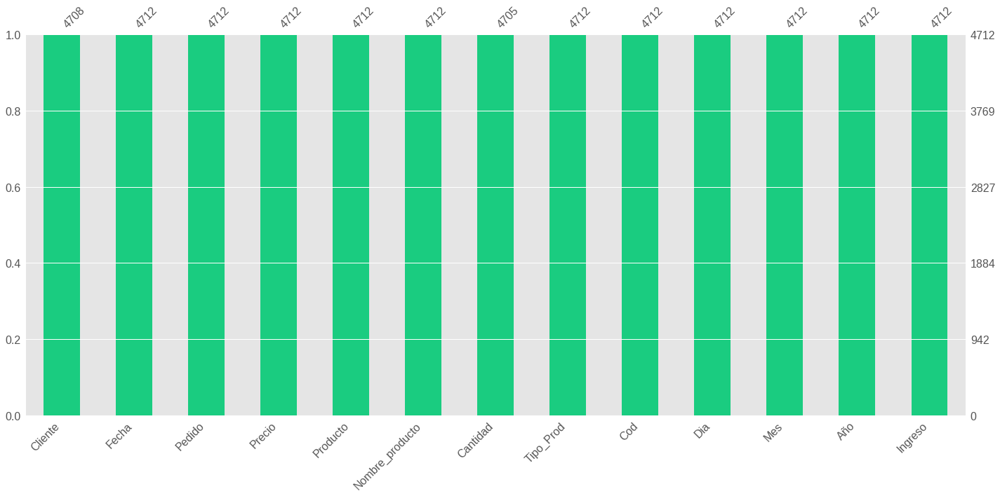

In [13]:
import missingno as msno
%matplotlib inline
print ("-----------------------------------")
print ("Cuantificación de valores faltantes por variable:""\n")
print(data.isnull().sum())
print ("                                            ***************************************")
print ("                                                       Missing Value Map")
print ("                                            ***************************************")
msno.bar(data.sample(4712),color=(0.1, 0.8, 0.5))

Los datos faltantes que se observa en el mapa corresponden a las variables `clientes` y `cantidad` donde el numero de datos faltantes son `4` y `7` respectivamente.

### Analisis descriptivo

In [14]:
data["Nombre_producto"].describe()

count               4712
unique               121
top       Tomate Chonto 
freq                 355
Name: Nombre_producto, dtype: object

El numero total de productos son `121`, el producto mas vendido es el `tomante chonto` con una frecuencia de 355 de 4712 ventas. correspondiente al 7.5% de las ventas totales.

In [15]:
data["Cliente"].describe()

count          4708
unique           33
top       Cliente32
freq            932
Name: Cliente, dtype: object

El cliente con mas cantidad de compras es el `Cliente32` con una frecuencia de `932 compras` de 4712 ventas de la compañia. correspodiente al 20% de las ventas totales.

In [16]:
print("")
print("                         Analisis Descriptivo Precio Vs Tipo producto")
data["Precio"].groupby(data["Tipo_Prod"]).describe()


                         Analisis Descriptivo Precio Vs Tipo producto


,count,mean,std,min,25%,50%,75%,max
Tipo_Prod,,,,,,,,
FRU,1843.0,2193.440043,1566.734363,640.0,1300.0,1700.0,2500.0,20000.0
GRA,57.0,4054.736842,1102.338594,1500.0,3000.0,3500.0,5160.0,7000.0
TUB,419.0,1189.856802,703.603492,400.0,800.0,1100.0,1350.0,7000.0
VER,2393.0,2072.879231,2074.115666,200.0,1000.0,1400.0,1900.0,16000.0


Se observa que los productos que tiene mas frecuencia en el Dataset son Frutas y verduras con 1843 y 2393 registros respectivamente. Por otro lado en promedio los precios mas altos estan en los granos.

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:482: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  box_data = remove_na(group_data[hue_mask])


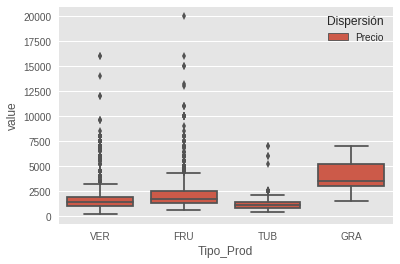

In [17]:
dp=pd.melt(data,id_vars=['Tipo_Prod'],value_vars=['Precio'],var_name='Dispersión')
sns.boxplot(x='Tipo_Prod',y='value',data=dp,hue='Dispersión')

Se observa una importante dispersión de precios en los grupos de Verduras y Frutas, mientras granos no presenta precios atípicos.


In [18]:
print("")
print("                 Analisis Descriptivo Demanda Vs Tipo producto")
data["Pedido"].groupby(data["Tipo_Prod"]).describe()


                 Analisis Descriptivo Demanda Vs Tipo producto


,count,mean,std,min,25%,50%,75%,max
Tipo_Prod,,,,,,,,
FRU,1843.0,4.914270,7.901898,1.0,1.0,2.0,6.0,126.0
GRA,57.0,3.456140,2.556994,1.0,1.0,3.0,4.0,10.0
TUB,419.0,4.415274,6.166692,1.0,1.0,2.0,4.0,50.0
VER,2393.0,5.036774,7.457313,1.0,1.0,3.0,6.0,100.0


Se observa que la mayor demanda en un dia lo tiene el tipo de producto `Frutas`, adicionalmene en promedio tanto frutas como verduras tienen `5 pedidos dia`.

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:482: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  box_data = remove_na(group_data[hue_mask])


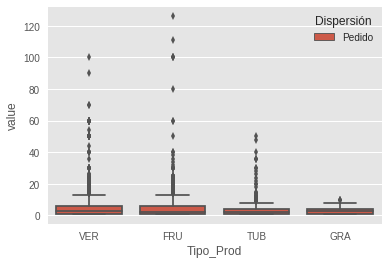

In [19]:
dd=pd.melt(data,id_vars=['Tipo_Prod'],value_vars=['Pedido'],var_name='Dispersión')
sns.boxplot(x='Tipo_Prod',y='value',data=dd,hue='Dispersión')

Se observa que existe una dispersion importante en el numero de pedidos para el caso de las verduras, frutas y tuberculos, mientras el grupo de granos es mas centrado en las cantidades demandas. 

In [20]:
print("")
print("                                        Analisis Descriptivo Ingresos Vs Tipo producto")
print("")
print("ingresos por tipo de producto:","\n","\n",data["Ingreso"].groupby(data["Tipo_Prod"]).sum())
print("")
print("ingresos Acumulados totales:","\n","\n",data["Ingreso"].cumsum())


                                        Analisis Descriptivo Ingresos Vs Tipo producto

ingresos por tipo de producto: 
 
 Tipo_Prod
FRU    15501270
GRA      710760
TUB     2199420
VER    20094870
Name: Ingreso, dtype: int64

ingresos Acumulados totales: 
 
 0          14000
1          26000
2          32400
3          47400
4          56200
5          86200
6         110200
7         114700
8         118200
9         121200
10        124000
11        125400
12        126400
13        147400
14        149000
15        155000
16        159000
17        163200
18        165100
19        168600
20        171200
21        180200
22        186700
23        194700
24        198900
25        201300
26        204600
27        210600
28        216600
29        232600
          ...   
4682    37977050
4683    37979850
4684    37987050
4685    37990570
4686    38006570
4687    38009770
4688    38010570
4689    38011850
4690    38015850
4691    38022570
4692    38025770
4693    38028570
4694    3

El tipo de producto que mas ingresos dejo son las `verduras`con `$ 20094870` seguido de las `frutas` con `$ 15501270`, adicionalmente los ingresos totales que tuvo la empresa fueron de `$38506320`.

In [21]:
print("")
print("                                        Analisis Descriptivo Total Demanda Vs Tipo producto")
print("")
print("Demanda total por tipo de producto:","\n","\n",data["Pedido"].groupby(data["Tipo_Prod"]).sum())
print("")
print("Demanda Acumulada Total:","\n","\n",data["Pedido"].cumsum())


                                        Analisis Descriptivo Total Demanda Vs Tipo producto

Demanda total por tipo de producto: 
 
 Tipo_Prod
FRU     9057
GRA      197
TUB     1850
VER    12053
Name: Pedido, dtype: int64

Demanda Acumulada Total: 
 
 0          20
1          30
2          34
3          44
4          52
5          82
6         106
7         107
8         108
9         110
10        112
11        113
12        115
13        118
14        119
15        124
16        128
17        131
18        132
19        137
20        139
21        142
22        147
23        149
24        150
25        152
26        155
27        158
28        162
29        178
        ...  
4682    22925
4683    22926
4684    22928
4685    22930
4686    22931
4687    22933
4688    22934
4689    22936
4690    22941
4691    22944
4692    22945
4693    22946
4694    22949
4695    23060
4696    23065
4697    23075
4698    23105
4699    23106
4700    23113
4701    23116
4702    23120
4703    23125
4704 

El tipo de producto que mas se vendió fueron las `verduras` con `12053 unidades` vendidas correspondiente al 52% de la demanda total, seguido de las `frutas` con `9057 unidades`, las unidades totales vendidas fueron de `23157` de todos los tipos de productos.

In [22]:
print("")
print("                                Analisis Descriptivo Precio Vs Producto")
data["Precio"].groupby(data["Nombre_producto"]).describe()


                                Analisis Descriptivo Precio Vs Producto


,count,mean,std,min,25%,50%,75%,max
Nombre_producto,,,,,,,,
Acelga,9.0,697.777778,84.524816,600.0,640.0,700.0,800.0,800.0
Agraz,10.0,9310.000000,3519.296015,6800.0,7000.0,7500.0,11625.0,15000.0
Aguacate Haas,30.0,2266.666667,227.934251,1600.0,2200.0,2250.0,2475.0,2500.0
Aguacate Papelillo,72.0,2504.166667,350.628209,2000.0,2350.0,2400.0,3000.0,3000.0
Ahuyama,47.0,631.914894,71.797974,550.0,550.0,600.0,700.0,750.0
Ajo Importado,18.0,6477.777778,495.337740,5800.0,6000.0,6650.0,6800.0,7500.0
Ajo Nacional,3.0,5900.000000,173.205081,5700.0,5850.0,6000.0,6000.0,6000.0
Ají Chirca,2.0,18000.000000,2828.427125,16000.0,17000.0,18000.0,19000.0,20000.0
Ají Jalapeño,9.0,3822.222222,352.766841,3200.0,4000.0,4000.0,4000.0,4000.0


In [13]:
print("")
print("                                        Analisis Descriptivo Demanda Vs Producto")
data["Pedido"].groupby(data["Nombre_producto"]).describe()


                                        Analisis Descriptivo Demanda Vs Producto


,count,mean,std,min,25%,50%,75%,max
Nombre_producto,,,,,,,,
Acelga,9.0,2.888889,2.848001,1.0,1.00,2.0,3.00,10.0
Agraz,10.0,2.200000,2.780887,1.0,1.00,1.0,2.00,10.0
Aguacate Haas,30.0,10.000000,26.148119,1.0,1.25,2.0,4.75,111.0
Aguacate Papelillo,72.0,3.180556,1.706049,1.0,2.00,3.0,4.00,12.0
Ahuyama,47.0,5.765957,9.842704,1.0,2.00,4.0,6.00,50.0
Ajo Importado,18.0,1.111111,0.471405,1.0,1.00,1.0,1.00,3.0
Ajo Nacional,3.0,1.333333,0.577350,1.0,1.00,1.0,1.50,2.0
Ají Chirca,2.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
Ají Jalapeño,9.0,2.222222,2.990726,1.0,1.00,1.0,1.00,10.0


In [24]:
print("")
print("                                        Analisis Descriptivo Ingresos Vs Producto")
print("")
print("Ingresos totales por Producto:","\n","\n",data["Ingreso"].groupby(data["Nombre_producto"]).sum().sort_values(ascending= False))


                                        Analisis Descriptivo Ingresos Vs Producto

Ingresos totales por Producto: 
 
 Nombre_producto
Tomate Chonto               5981700
Champiñón                   4029800
Pimentón Rojo               2203150
Lechuga Crespa              1718400
Zucchini Verde              1628100
Cebolla Cabezona Roja       1352800
Pepino Cohombro             1311030
Cebolla Cabezona Blanca     1202220
Plátano Maduro              1132900
Zanahoria                   1125600
Limón Tahití                1035500
Berenjena                    973400
Perejil Crespo               917200
Tomate Larga Vida            719200
Aguacate Haas                600000
Banano Criollo               591600
Aguacate Papelillo           579900
Mazorca Desgranada           482000
Fresa Pareja                 463200
Breva                        462000
Rúgula                       384400
Piña Golden Sweet            376480
Perejil Liso                 363900
Mora Castilla                345150
M

El producto que mas ingresos genero fue el `tomante chonto` `$5981700`, seguido del `Champiñon`  `$4029800` y `Pimenton Rojo`  `$2203150`.

In [25]:
print("")
print("                                        Analisis Descriptivo Total Demanda Vs Producto")
print("")
print("Demanda total por Producto:","\n","\n",data["Pedido"].groupby(data["Nombre_producto"]).sum().sort_values(ascending= False))


                                        Analisis Descriptivo Total Demanda Vs Producto

Demanda total por Producto: 
 
 Nombre_producto
Tomate Chonto               4000
Pepino Cohombro             1360
Pimentón Rojo               1324
Zucchini Verde              1211
Lechuga Crespa              1094
Plátano Maduro              1064
Zanahoria                    961
Cebolla Cabezona Blanca      874
Cebolla Cabezona Roja        858
Limón Tahití                 802
Berenjena                    670
Champiñón                    547
Banano Criollo               518
Tomate Larga Vida            471
Perejil Liso                 400
Aguacate Haas                300
Ahuyama                      271
Naranja Sweety               270
Fresa Pareja                 255
Aguacate Papelillo           229
Yerbabuena                   221
Cilantro                     220
Cebolla Larga                198
Papa Criolla                 197
Rúgula                       188
Mango Tommy Atkins           178
Mora 

el producto con mayor demanda fue el `tomante chonto` con `4000 unidades` totales vendidas, correspondiente al `17%` de la demanda total y al `44%` de la demanda total de frutas , seguido del `pepino cohombro` con `1360 unidades`.

In [26]:
print("")
print("                                  Analisis Descriptivo Cliente Vs Producto-Tipo producto")
data.groupby('Cliente')['Nombre_producto',"Tipo_Prod",].nunique().describe()


                                  Analisis Descriptivo Cliente Vs Producto-Tipo producto


,Nombre_producto,Tipo_Prod
count,33.000000,33.000000
mean,28.272727,3.272727
std,18.327358,0.674200
min,4.000000,2.000000
25%,16.000000,3.000000
50%,20.000000,3.000000
75%,44.000000,4.000000
max,66.000000,4.000000


Los clientes compraron en promedio `28 productos` un maximo de 66 productos y un minimo de 4 productos, asi mismo en promedio lo clientes compraron 3 tipos de productos minimo 2 y cerca del 75% de los clientes compraron los 4 tipos de producto `Verduras`, `Frutas`, `Tuberculos` y `Granos`.

In [27]:
print("")
print("                                         Analisis Descriptivo Precio Vs Cliente")
data["Precio"].groupby(data["Cliente"]).describe()


                                         Analisis Descriptivo Precio Vs Cliente


,count,mean,std,min,25%,50%,75%,max
Cliente,,,,,,,,
Cliente1,37.0,2357.567568,1747.015559,680.0,1100.0,1600.0,3500.0,8000.0
Cliente10,193.0,2530.000000,2307.752559,400.0,1200.0,1700.0,2600.0,11000.0
Cliente11,32.0,2206.250000,1841.447099,900.0,1100.0,1350.0,2625.0,7500.0
Cliente12,49.0,2846.530612,3019.117939,400.0,1200.0,1600.0,3500.0,15000.0
Cliente13,168.0,1480.059524,799.590836,400.0,900.0,1400.0,1800.0,4500.0
Cliente14,68.0,2005.588235,1566.356531,400.0,1075.0,1300.0,2510.0,7000.0
Cliente15,30.0,2266.666667,1835.912501,400.0,1200.0,1900.0,2500.0,7000.0
Cliente16,193.0,2470.103627,2039.383074,400.0,1200.0,1600.0,3200.0,10000.0
Cliente17,9.0,3840.000000,4656.006873,800.0,1600.0,2800.0,3200.0,16000.0


In [28]:
print("El mayor precio de los productos es = " + str(data.Precio.max()))
print("El precio promedio de los productos es = " + str(data.Precio.mean()))
print("El menor precio de los productos es = " + str(data.Precio.min()))

El mayor precio de los productos es = 20000
El precio promedio de los productos es = 2065.4881154499153
El menor precio de los productos es = 200


Se organiza la base de datos para conocer el producto con mayor precio.

In [29]:
data.sort_values("Precio", ascending= False).head()

,Cliente,Fecha,Pedido,Precio,Producto,Nombre_producto,Cantidad,Tipo_Prod,Cod,Dia,Mes,Año,Ingreso
4699,Cliente27,17/11/2016,1,20000,FRU0004,Ají Chirca,NaN,FRU,004,17,11,2016,20000
3327,Cliente6,07/02/2017,1,16000,VER0019,Esparrago,Libra,VER,019,07,02,2017,16000
4686,Cliente17,18/11/2016,1,16000,FRU0004,Ají Chirca,NaN,FRU,004,18,11,2016,16000
4675,Cliente32,20/11/2016,1,16000,VER0051,Perejil Crespo,100 gramos,VER,051,20,11,2016,16000
4125,Cliente12,13/12/2016,1,15000,FRU0001,Agraz,Libra,FRU,001,13,12,2016,15000


el producto mas costoso del dataset es `Ají Chirca` con un precio de `20000` seguido de `Esparrago`,`Perejil Crespo` con precios de `16000`.

In [30]:
print("")
print("                                  Analisis Descriptivo Ingresos Vs Cliente-Tipo producto")
print("")
print("Ingresos totales por clientes-Tipo Producto:","\n","\n",data["Ingreso"].groupby([data["Cliente"],data["Tipo_Prod"]]).sum())
print("")
print("Ingresos totales por clientes:","\n","\n",data["Ingreso"].groupby(data["Cliente"]).sum().sort_values(ascending= False))


                                  Analisis Descriptivo Ingresos Vs Cliente-Tipo producto

Ingresos totales por clientes-Tipo Producto: 
 
 Cliente    Tipo_Prod
Cliente1   FRU           114030
           TUB              900
           VER            14500
Cliente10  FRU           603330
           GRA            19000
           TUB            72300
           VER           259000
Cliente11  FRU           151800
           GRA           138500
           VER            18700
Cliente12  FRU           107360
           GRA            15480
           TUB            20540
           VER            72860
Cliente13  FRU           369050
           TUB            62500
           VER           199550
Cliente14  FRU           203120
           GRA             5160
           TUB            32420
           VER            69940
Cliente15  FRU           168400
           TUB             1500
           VER            71600
Cliente16  FRU          1218280
           GRA            14200
       

El cliente que mas compro fue el `cliente32` con `$ 9762040` seguido del `cliente29`con `$7536400`.

In [31]:
print("")
print("                                  Analisis Descriptivo Demanda Vs Cliente-Tipo producto")
data["Pedido"].groupby([data["Cliente"],data["Tipo_Prod"]]).describe()


                                  Analisis Descriptivo Demanda Vs Cliente-Tipo producto


count       mean        std  min    25%   50%    75%  \
Cliente   Tipo_Prod                                                         
Cliente1  FRU         31.0   2.161290   1.916538  1.0   1.00   1.0   2.00   
          TUB          1.0   1.000000        NaN  1.0   1.00   1.0   1.00   
          VER          5.0   1.000000   0.000000  1.0   1.00   1.0   1.00   
Cliente10 FRU         87.0   3.172414   3.217709  1.0   2.00   2.0   3.00   
          GRA          2.0   2.000000   0.000000  2.0   2.00   2.0   2.00   
          TUB         32.0   1.781250   0.750672  1.0   1.00   2.0   2.00   
          VER         72.0   1.791667   0.933530  1.0   1.00   2.0   2.00   
Cliente11 FRU         23.0   4.782609   4.879983  1.0   2.00   3.0   5.50   
          GRA          5.0   8.200000   1.788854  6.0   7.00   8.0  10.00   
          VER          4.0   4.250000   2.362908  1.0   3.25   5.0   6.00   
Cliente12 FRU         17.0   2.058824   1.297622  1.0   1.00   2.0   3.00   
          GRA          2.0   1.500000   0.707107  1.0   1.25   1.5   1.75   
          TUB          8.0   1.500000   0.755929  1.0   1.00   1.0   2.00   
          VER         22.0   1.636364   0.726731  1.0   1.00   1.5   2.00   
Cliente13 FRU         74.0   3.567568   3.149608  1.0   1.00   2.0   5.00   
          TUB         23.0   2.086957   1.831866  1.0   1.00   1.0   2.00   
          VER         71.0   2.112676   1.336833  1.0   1.00   2.0   2.50   
Cliente14 FRU         31.0   4.709677   5.945270  1.0   1.00   3.0   4.50   
          GRA          1.0   1.000000        NaN  1.0   1.00   1.0   1.00   
          TUB         11.0   2.909091   1.221028  2.0   2.00   3.0   3.00   
          VER         25.0   1.680000   1.029563  1.0   1.00   2.0   2.00   
Cliente15 FRU         13.0   6.769231   5.629592  1.0   2.00   6.0   9.00   
          TUB          1.0   1.000000        NaN  1.0   1.00   1.0   1.00   
          VER         16.0   4.437500   7.023473  1.0   1.00   2.0   4.25   
Cliente16 FRU         95.0   4.694737  14.236658  1.0   1.00   2.0   3.00   
          GRA          2.0   2.000000   1.414214  1.0   1.50   2.0   2.50   
          TUB         27.0   1.925926   1.685365  1.0   1.00   2.0   2.00   
          VER         69.0   1.695652   0.772779  1.0   1.00   2.0   2.00   
Cliente17 FRU          5.0   1.600000   0.547723  1.0   1.00   2.0   2.00   
          GRA          1.0   2.000000        NaN  2.0   2.00   2.0   2.00   
...                    ...        ...        ...  ...    ...   ...    ...   
Cliente3  TUB         74.0   2.797297   1.638407  1.0   1.00   3.0   4.00   
          VER        222.0   2.189189   1.394972  1.0   1.00   2.0   3.00   
Cliente30 FRU         20.0  16.450000  32.066502  1.0   1.00   3.0  10.00   
          TUB          2.0   1.500000   0.707107  1.0   1.25   1.5   1.75   
          VER          6.0   3.166667   3.710346  1.0   1.00   1.0   4.00   
Cliente31 FRU          2.0   6.500000   6.363961  2.0   4.25   6.5   8.75   
          VER          2.0   2.500000   0.707107  2.0   2.25   2.5   2.75   
Cliente32 FRU        234.0   9.414530  10.249001  1.0   3.00   9.0  12.00   
          TUB         26.0   3.923077   1.741794  2.0   3.00   4.0   5.00   
          VER        672.0   6.510417   6.235078  1.0   2.00   5.0   9.00   
Cliente33 FRU          2.0   2.000000   1.414214  1.0   1.50   2.0   2.50   
          TUB          3.0   3.000000   0.000000  3.0   3.00   3.0   3.00   
          VER          2.0   2.500000   0.707107  2.0   2.25   2.5   2.75   
Cliente4  FRU         16.0   2.062500   1.982213  1.0   1.00   1.0   2.00   
          TUB          2.0   5.000000   0.000000  5.0   5.00   5.0   5.00   
          VER         17.0   5.529412   9.361608  1.0   1.00   2.0   5.00   
Cliente5  FRU         12.0   1.583333   0.792961  1.0   1.00   1.0   2.00   
          GRA          1.0   1.000000        NaN  1.0   1.00   1.0   1.00   
          VER          7.0   1.428571   0.534522  1.0   1.00   1.0   2.00   
Cliente6  FRU    

In [32]:
print("El mayor pedido de los productos es = " + str(data.Pedido.max()))
print("El pedido promedio de los productos es = " + str(data.Pedido.mean()))
print("El menor pedido de los productos es = " + str(data.Pedido.min()))

El mayor pedido de los productos es = 126
El pedido promedio de los productos es = 4.9144736842105265
El menor pedido de los productos es = 1


In [33]:
print("")
print("                                  Analisis Descriptivo Demanda Vs Cliente-Tipo producto")
print("")
print("Demanda total por clientes-Tipo Producto:","\n","\n",data["Pedido"].groupby([data["Cliente"],data["Tipo_Prod"]]).sum())
print("")
print("Demanda total por clientes:","\n","\n",data["Pedido"].groupby(data["Cliente"]).sum().sort_values(ascending= False))


                                  Analisis Descriptivo Demanda Vs Cliente-Tipo producto

Demanda total por clientes-Tipo Producto: 
 
 Cliente    Tipo_Prod
Cliente1   FRU            67
           TUB             1
           VER             5
Cliente10  FRU           276
           GRA             4
           TUB            57
           VER           129
Cliente11  FRU           110
           GRA            41
           VER            17
Cliente12  FRU            35
           GRA             3
           TUB            12
           VER            36
Cliente13  FRU           264
           TUB            48
           VER           150
Cliente14  FRU           146
           GRA             1
           TUB            32
           VER            42
Cliente15  FRU            88
           TUB             1
           VER            71
Cliente16  FRU           446
           GRA             4
           TUB            52
           VER           117
Cliente17  FRU             8
  

el cliente que mas compro en numero de unidades fue el `cliente32` con `6680 unidades` de las cuales el `65%` corresponden a `Verduras`, seguido del `cliente29` con `3188 unidades`, estos dos clientes fueron los que mas ingresos dejaron a la compañia.

### Imputacion de datos 

De acuerdo al analisis de valores faltantes realizado anteriormente se observa que la columna clientes tiene 4 observaciones con valor NA, por lo tanto se propone reemplazar estos valores validando el producto asociado a la observacion faltante en la columna cliente dada la frecuencia de compra de estos productos por cada cliente.

Con el objetivo de reemplazar los valores faltantes de clientes se identifica la frecuencia de compra asociada de cada producto por cliente.

In [34]:
print("")
print("                                  Analisis Descriptivo Demanda Cebolla Cabezona Blanca Vs Cliente")
print("")
print("Demanda total clientes-Tipo Producto:","\n","\n",data["Pedido"].groupby([data["Cliente"],data["Nombre_producto"]]).sum().sort_values(ascending= False))
print("")


                                  Analisis Descriptivo Demanda Cebolla Cabezona Blanca Vs Cliente

Demanda total clientes-Tipo Producto: 
 
 Cliente    Nombre_producto         
Cliente32  Tomate Chonto               1698
Cliente29  Tomate Chonto               1062
Cliente32  Pepino Cohombro             1056
Cliente29  Lechuga Crespa               966
Cliente26  Plátano Maduro               826
Cliente32  Pimentón Rojo                783
           Zucchini Verde               771
Cliente26  Cebolla Cabezona Blanca      686
Cliente32  Berenjena                    551
Cliente26  Zanahoria                    426
Cliente32  Cebolla Cabezona Roja        422
           Limón Tahití                 408
Cliente29  Champiñón                    391
Cliente32  Perejil Liso                 331
Cliente23  Tomate Chonto                320
Cliente26  Pimentón Rojo                315
Cliente21  Tomate Chonto                286
           Banano Criollo               214
Cliente26  Tomate Larga Vida  

Para el caso del `tomate chonto` se encuentra que el cliente con mayor frecuencia de compra es el `cliente32`, por lo tanto este tiene mayores probabilidades de comprar este producto, el valor NA del cliente asociado a este producto es reemplazado por el `cliente32`, con la misma logica se reemplanza los 3 valores adicionales.

**Valores Imputados**: 
<table style="width:15%">
  <tr>
    <td>**Tomate Chonto**</td>
    <td> Cliente32 </td> 
  </tr>
  
  <tr>
    <td>**Cebolla Cabezona Blanca**</td>
    <td> Cliente 26 </td> 
  </tr>
  
  <tr>
    <td>**Pimenton Rojo**</td>
    <td> Cliente26 </td> 
  </tr>
  
   <tr>
    <td>**Pepino Cohombro**</td>
    <td> Cliente32 </td> 
  </tr>
  
</table>

In [0]:
import collections
products = collections.Counter(data["Nombre_producto"])
products = pd.DataFrame.from_dict(list(products.items()))

In [0]:
products = products.rename(index=str, columns={0: "Nombre_producto", 1: "Counter"})

In [0]:
data1 = pd.merge(data, products, on='Nombre_producto')

In [38]:
data1["Nombre_producto"][(data1["Counter"]==2)]

4532      Pera Nacional 
4533      Pera Nacional 
4662    Haba Desgranada 
4663    Haba Desgranada 
4699               Higo 
4700               Higo 
4707          Ají Chirca
4708          Ají Chirca
Name: Nombre_producto, dtype: object

Con lo anterior se puede apreciar que de los 121 productos, 13 se encuentran por debajo de 3, lo que indica que estos 13 productos fueron comparados máximo 2 veces en el periodo de tiempo contemplado, por la razón anteriormente expuesta se eliminarán estos registros del data frame.

In [0]:
data2 = data1.drop(data1[data1.Counter <= 2].index)

Finalmente y para el análisis de la predicción de los productos, se tendrán en cuenta un total de 108 productos 

### Analisis Grafico

                      ***************************************
                       DISTRIBUTION OF VARIABLES IN DATA SET
                      ***************************************


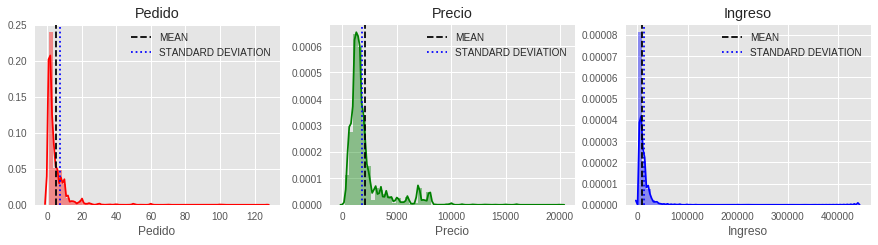

In [40]:
import warnings
import itertools
columns = ['Pedido', 'Precio',"Ingreso"]
length  = len(columns)
colors  = ["r","g","b"] 

plt.figure(figsize=(15,12))
for i,j,k in itertools.zip_longest(columns,range(length),colors):
    plt.subplot(length/1,length/1,j+1)
    sns.distplot(data[i],color=k)
    plt.title(i)
    plt.subplots_adjust(hspace = .3)
    plt.axvline(data[i].mean(),color = "k",linestyle="dashed",label="MEAN")
    plt.axvline(data[i].std(),color = "b",linestyle="dotted",label="STANDARD DEVIATION")
    plt.legend(loc="upper right")
     
print ("                      ***************************************")
print ("                       DISTRIBUTION OF VARIABLES IN DATA SET")
print ("                      ***************************************")

De acuerdo a la anterior grafica se observa que la distribucion de `Pedido`,`Precio`, `Ingreso` tiene una alta curtuosis dado que los valores se distribuyen mas hacia la media. Por otro lado se observan algunos valores atipicos que se salen de la normalidad de la distribucion para el caso de la variable pedido los datos atipicos se ven por encima de 10 y para precio por encima de 10000.

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:588: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  kde_data = remove_na(group_data)
/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:816: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  violin_data = remove_na(group_data)


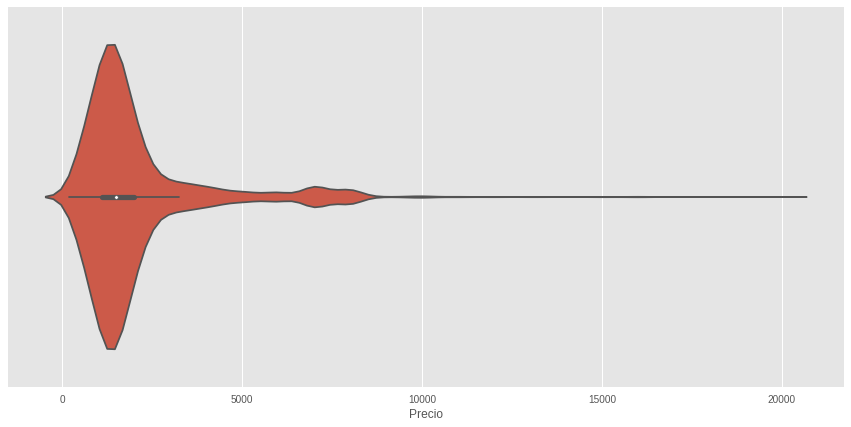

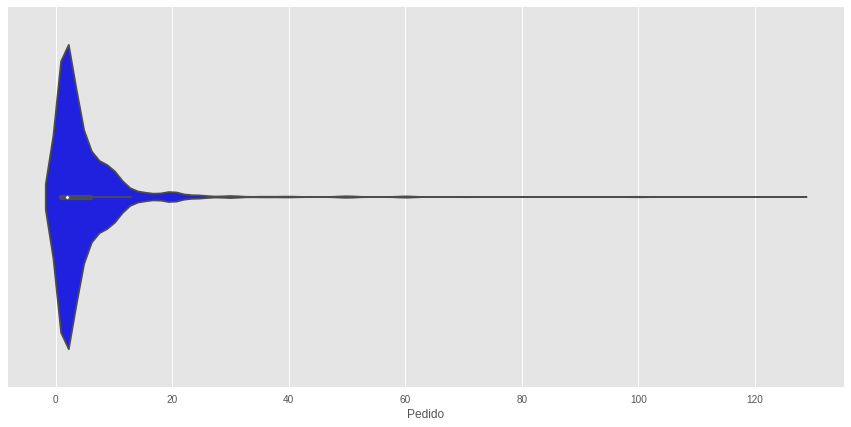

In [41]:
plt.figure(figsize=(15,7))
sns.violinplot("Precio", data=data);
plt.show()
plt.figure(figsize=(15,7))
sns.violinplot("Pedido", data=data,color="Blue");
plt.show()

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:1468: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data[hue_mask])


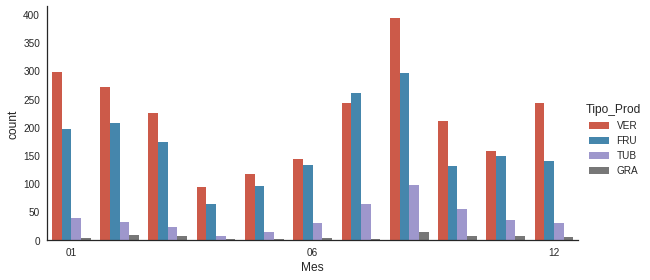

In [42]:
plt.figure(figsize=(15,12))
with sns.axes_style('white'):
    g = sns.factorplot("Mes", data=data, aspect=2,
                       kind="count", hue="Tipo_Prod")
    g.set_xticklabels(step=5)
plt.show()

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:588: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  kde_data = remove_na(group_data)
/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:816: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  violin_data = remove_na(group_data)


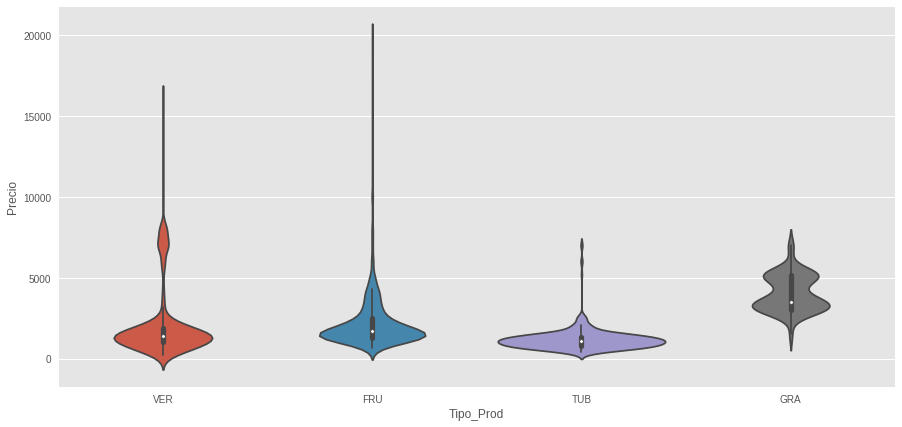

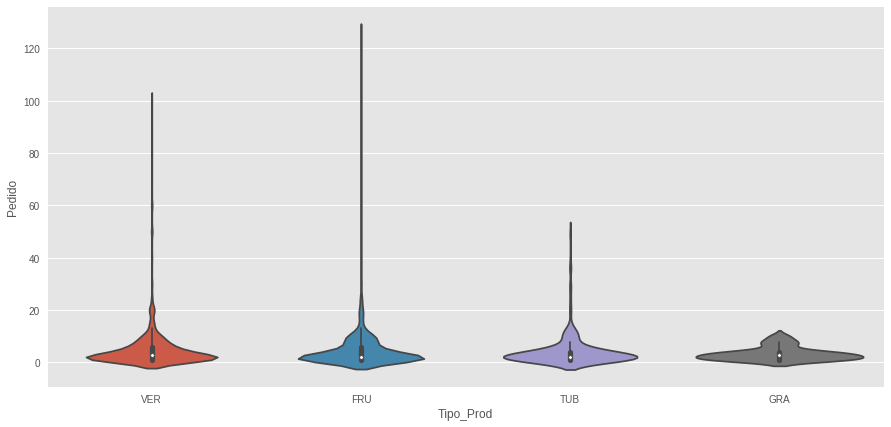

In [43]:
plt.figure(figsize=(15,7))
sns.violinplot("Tipo_Prod", "Precio", data=data);
plt.show()

plt.figure(figsize=(15,7))
sns.violinplot("Tipo_Prod", "Pedido", data=data);
plt.show()

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:637: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  kde_data = remove_na(group_data[hue_mask])
/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:932: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  violin_data = remove_na(group_data[hue_mask])


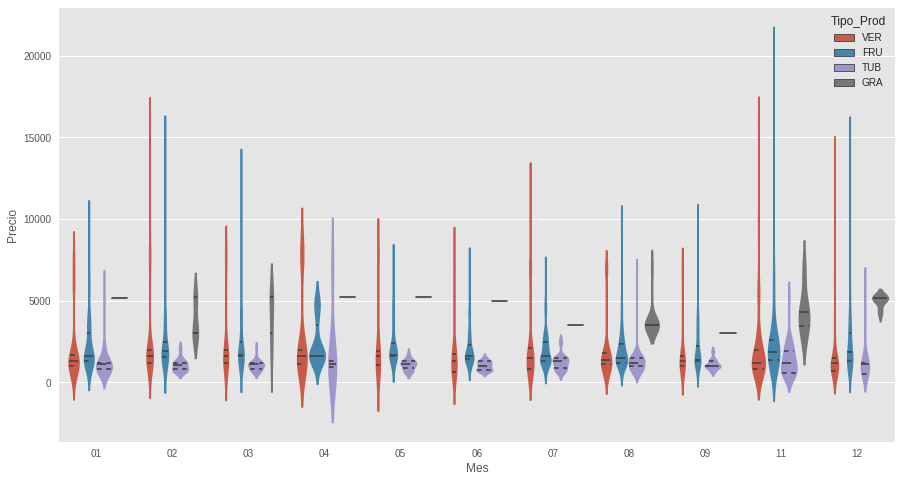

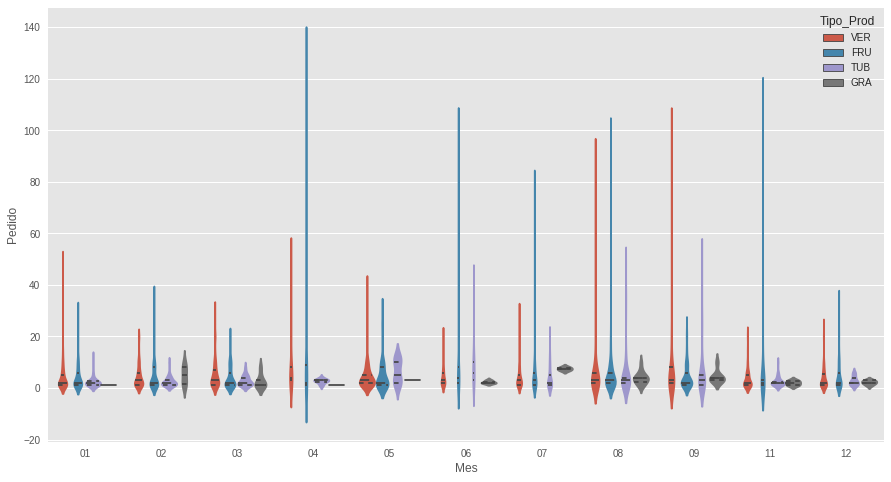

In [44]:
plt.figure(figsize=(15,8))
with sns.axes_style(style=None):
    sns.violinplot("Mes", "Precio", hue="Tipo_Prod", data=data,
                   split=False, inner="quartile");
plt.show()

plt.figure(figsize=(15,8))
with sns.axes_style(style=None):
    sns.violinplot("Mes", "Pedido", hue="Tipo_Prod", data=data,
                   split=False, inner="quartile");
plt.show()

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:588: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  kde_data = remove_na(group_data)
/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:816: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  violin_data = remove_na(group_data)


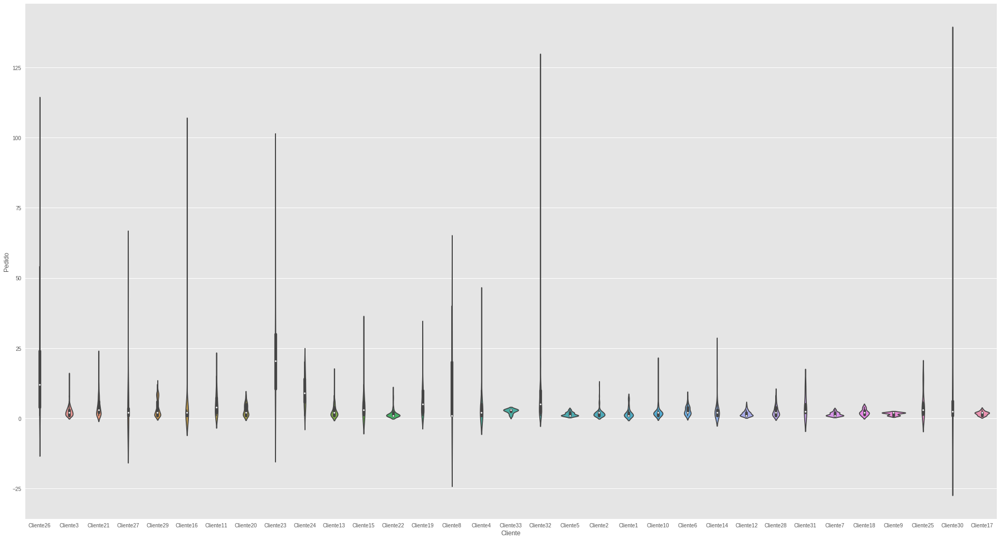

In [45]:
plt.figure(figsize=(33,18))
sns.violinplot("Cliente", "Pedido", data=data);
plt.show()

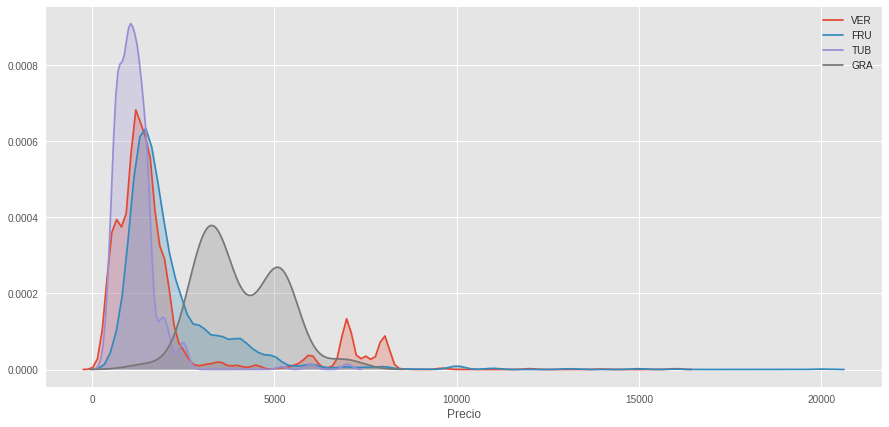

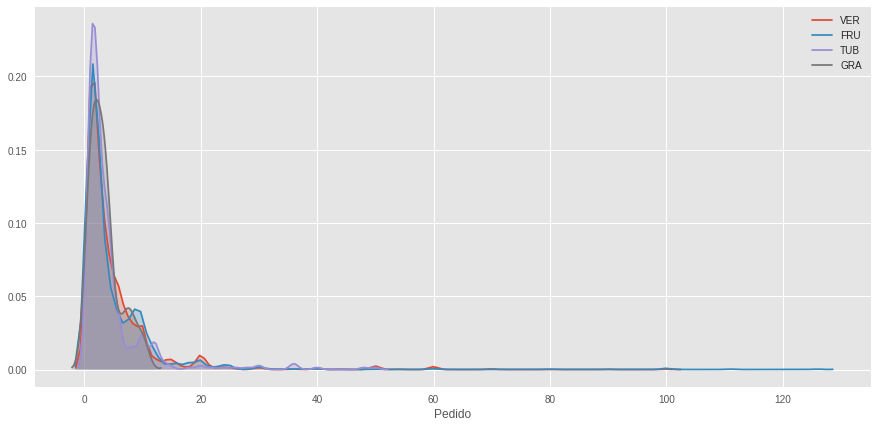

In [46]:
plt.figure(figsize=(15,7))
sns.kdeplot(data.Precio[data.Tipo_Prod=='VER'], label='VER', shade=True)
sns.kdeplot(data.Precio[data.Tipo_Prod=='FRU'], label='FRU', shade=True)
sns.kdeplot(data.Precio[data.Tipo_Prod=='TUB'], label='TUB', shade=True)
sns.kdeplot(data.Precio[data.Tipo_Prod=='GRA'], label='GRA', shade=True)
plt.xlabel('Precio');
plt.figure(figsize=(15,7))
sns.kdeplot(data.Pedido[data.Tipo_Prod=='VER'], label='VER', shade=True)
sns.kdeplot(data.Pedido[data.Tipo_Prod=='FRU'], label='FRU', shade=True)
sns.kdeplot(data.Pedido[data.Tipo_Prod=='TUB'], label='TUB', shade=True)
sns.kdeplot(data.Pedido[data.Tipo_Prod=='GRA'], label='GRA', shade=True)
plt.xlabel('Pedido');
plt.show()

In [0]:
data_Precio=pd.DataFrame(data["Precio"].groupby(data["Fecha"],sort=False).sum())
data_Pedido=pd.DataFrame(data["Pedido"].groupby(data["Fecha"],sort=False).sum())
data_Ingreso=pd.DataFrame(data["Ingreso"].groupby(data["Fecha"],sort=False).sum())
#data_Precio.to_csv('data_Precio.csv',index=True)
#data_Pedido.to_csv('data_Pedido.csv',index=True
#data_Ingreso.to_csv('data_Ingreso.csv',index=True)
#data_Ingreso=data_Ingreso.reset_index()

In [0]:
data_Pedido=pd.read_excel('data_Pedido.xlsx')
data_Ingreso=pd.read_excel('data_Ingreso.xlsx')

In [0]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))

In [23]:
import plotly.plotly as py
import numpy as np
from plotly.offline import init_notebook_mode, iplot
from plotly.graph_objs import Contours, Histogram2dContour, Marker, Scatter, Line, Figure, Marker,Layout

configure_plotly_browser_state()

init_notebook_mode(connected=False)

trace1 = Scatter(
    x=data_Pedido["Fecha"],
    y=data_Pedido["Pedido"],
    name="Demanda",
    marker=Marker(color="Blue")
)

layout=Layout(title='Serie de Tiempo Demanda',xaxis=dict(title='Fecha',titlefont=dict(family='Courier New, monospace',size=18,color='#7f7f7f')), yaxis=dict(title='Demanda',
titlefont=dict(family='Courier New, monospace',size=18,color='#7f7f7f')))
              
data1 =[trace1]
fig =Figure(data=data1,layout=layout)
iplot(data1)

trace2 = Scatter(
    x=data_Ingreso["Fecha"],
    y=data_Ingreso["Ingreso"],
    name="Ingreso",
    marker=Marker(color="Red")
)

layout=Layout(title='Serie de Tiempo Ingreso',xaxis=dict(title='Fecha',titlefont=dict(family='Courier New, monospace',size=18,color='#7f7f7f')), yaxis=dict(title='Demanda',
titlefont=dict(family='Courier New, monospace',size=18,color='#7f7f7f')))
              
data2 =[trace2]
fig =Figure(data=data2,layout=layout)
iplot(data2)

In [0]:
Ingresos=data["Ingreso"].groupby(data["Nombre_producto"]).sum()

In [37]:
pd.options.display.max_seq_items = 10000
Ingresos=pd.DataFrame(Ingresos)
Ingresos.sort_values("Ingreso",ascending=False).head()

,Ingreso
Nombre_producto,
Tomate Chonto,5981700
Champiñón,4029800
Pimentón Rojo,2203150
Lechuga Crespa,1718400
Zucchini Verde,1628100


In [0]:
Ingresos=Ingresos.sort_values("Ingreso",ascending=False)
Ingresos['cumulative_sum'] = Ingresos.Ingreso.cumsum()
Ingresos['cumulative_perc'] = 100*Ingresos.cumulative_sum/Ingresos.Ingreso.sum()
Ingresos['demarcation'] = 80

In [39]:
Ingresos=Ingresos.reset_index()
Ingresos.head()

,Nombre_producto,Ingreso,cumulative_sum,cumulative_perc,demarcation
0,Tomate Chonto,5981700,5981700,15.534333,80
1,Champiñón,4029800,10011500,25.999628,80
2,Pimentón Rojo,2203150,12214650,31.721156,80
3,Lechuga Crespa,1718400,13933050,36.183800,80
4,Zucchini Verde,1628100,15561150,40.411938,80


In [55]:
from plotly.graph_objs import *

configure_plotly_browser_state()

init_notebook_mode(connected=False)

trace1 = Bar(
    x=Ingresos.Nombre_producto,
    y=Ingresos.Ingreso,
    name='Ingresos',
    marker=dict(
        color='rgb(34,163,192)'
               )
)
trace2 = Scatter(
    x=Ingresos.Nombre_producto,
    y=Ingresos.cumulative_perc,
    name='Cumulative Percentage',
    yaxis='y2',
    line=dict(
        color='rgb(243,158,115)',
        width=2.4
       )
)
trace3 = Scatter(
    x=Ingresos.Nombre_producto,
    y=Ingresos.demarcation,
    name='80% Pareto Rule',
    yaxis='y2',
    line=dict(
        color='rgba(128,128,128,.45)',
        dash = 'dash',
        width=1.5
       )
)
data = [trace1, trace2,trace3]
layout = Layout(
    title='Diagrama de Pareto Ingresos Start Up',
    titlefont=dict(
        color='',
        family='',
        size=0
    ),
    font=Font(
        color='rgb(128,128,128)',
        family='Balto, sans-serif',
        size=12
    ),
    width=1500,
    height=623,
    paper_bgcolor='rgb(240, 240, 240)',
    plot_bgcolor='rgb(240, 240, 240)',
    hovermode='compare',
    margin=dict(b=250,l=60,r=60,t=65),
    showlegend=True,
       legend=dict(
          x=.83,
          y=1.3,
          font=dict(
            family='Balto, sans-serif',
            size=12,
            color='rgba(128,128,128,.75)'
        ),
    ),
    annotations=[ dict(
                  text="Cumulative Percentage",
                  showarrow=False,
                  xref="paper", yref="paper",
                  textangle=90,
                  x=1.029, y=.75,
                  font=dict(
                  family='Balto, sans-serif',
                  size=14,
                  color='rgba(243,158,115,.9)'
            ),)],
    xaxis=dict(
      tickangle=-90
    ),
    yaxis=dict(
        title='Count',
        range=[0,5981700],
      tickfont=dict(
            color='rgba(34,163,192,.75)'
        ),
      tickvals = [0,1178340,2356680,3535020,4713360,5892000],
        titlefont=dict(
                family='Balto, sans-serif',
                size=14,
                color='rgba(34,163,192,.75)')
    ),
    yaxis2=dict(
        range=[0,101],
        tickfont=dict(
            color='rgba(243,158,115,.9)'
        ),
        tickvals = [0,20,40,60,80,100],
        overlaying='y',
        side='right'
    )
)

fig = dict(data=data, layout=layout)
iplot(fig)

In [17]:
Demanda=data["Pedido"].groupby(data["Nombre_producto"]).sum()
Demanda=pd.DataFrame(Demanda)
Demanda.sort_values("Pedido",ascending=False).head()

,Pedido
Nombre_producto,
Tomate Chonto,4000
Pepino Cohombro,1360
Pimentón Rojo,1324
Zucchini Verde,1211
Lechuga Crespa,1094


In [18]:
Demanda=Demanda.sort_values("Pedido",ascending=False)
Demanda['cumulative_sum'] = Demanda.Pedido.cumsum()
Demanda['cumulative_perc'] = 100*Demanda.cumulative_sum/Demanda.Pedido.sum()
Demanda['demarcation'] = 80
Demanda.head()

,Pedido,cumulative_sum,cumulative_perc,demarcation
Nombre_producto,,,,
Tomate Chonto,4000,4000,17.273395,80
Pepino Cohombro,1360,5360,23.146349,80
Pimentón Rojo,1324,6684,28.863842,80
Zucchini Verde,1211,7895,34.093363,80
Lechuga Crespa,1094,8989,38.817636,80


In [19]:
Demanda=Demanda.reset_index()
Demanda.head()

,Nombre_producto,Pedido,cumulative_sum,cumulative_perc,demarcation
0,Tomate Chonto,4000,4000,17.273395,80
1,Pepino Cohombro,1360,5360,23.146349,80
2,Pimentón Rojo,1324,6684,28.863842,80
3,Zucchini Verde,1211,7895,34.093363,80
4,Lechuga Crespa,1094,8989,38.817636,80


In [24]:
from plotly.graph_objs import *

configure_plotly_browser_state()

init_notebook_mode(connected=False)

trace1 = Bar(
    x=Demanda.Nombre_producto,
    y=Demanda.Pedido,
    name='Pedido',
    marker=dict(
        color='rgb(34,163,192)'
               )
)
trace2 = Scatter(
    x=Demanda.Nombre_producto,
    y=Demanda.cumulative_perc,
    name='Cumulative Percentage',
    yaxis='y2',
    line=dict(
        color='rgb(243,158,115)',
        width=2.4
       )
)
trace3 = Scatter(
    x=Demanda.Nombre_producto,
    y=Demanda.demarcation,
    name='80% Pareto Rule',
    yaxis='y2',
    line=dict(
        color='rgba(128,128,128,.45)',
        dash = 'dash',
        width=1.5
       )
)
data = [trace1, trace2,trace3]
layout = Layout(
    title='Diagrama de Pareto Pedido Start Up',
    titlefont=dict(
        color='',
        family='',
        size=0
    ),
    font=Font(
        color='rgb(128,128,128)',
        family='Balto, sans-serif',
        size=12
    ),
    width=1500,
    height=623,
    paper_bgcolor='rgb(240, 240, 240)',
    plot_bgcolor='rgb(240, 240, 240)',
    hovermode='compare',
    margin=dict(b=250,l=60,r=60,t=65),
    showlegend=True,
       legend=dict(
          x=.83,
          y=1.3,
          font=dict(
            family='Balto, sans-serif',
            size=12,
            color='rgba(128,128,128,.75)'
        ),
    ),
    annotations=[ dict(
                  text="Cumulative Percentage",
                  showarrow=False,
                  xref="paper", yref="paper",
                  textangle=90,
                  x=1.029, y=.75,
                  font=dict(
                  family='Balto, sans-serif',
                  size=14,
                  color='rgba(243,158,115,.9)'
            ),)],
    xaxis=dict(
      tickangle=-90
    ),
    yaxis=dict(
        title='Count',
        range=[0,5000],
      tickfont=dict(
            color='rgba(34,163,192,.75)'
        ),
      tickvals = [0,820,1640,2460,3280,4100],
        titlefont=dict(
                family='Balto, sans-serif',
                size=14,
                color='rgba(34,163,192,.75)')
    ),
    yaxis2=dict(
        range=[0,101],
        tickfont=dict(
            color='rgba(243,158,115,.9)'
        ),
        tickvals = [0,20,40,60,80,100],
        overlaying='y',
        side='right'
    )
)

fig = dict(data=data, layout=layout)
iplot(fig)

In [25]:
print ("                                                           ") 
print ("                                                    TOP PRODUCTOS PEDIDO")
Demanda.head(26)

                                                           
                                                    TOP PRODUCTOS PEDIDO


,Nombre_producto,Pedido,cumulative_sum,cumulative_perc,demarcation
0,Tomate Chonto,4000,4000,17.273395,80
1,Pepino Cohombro,1360,5360,23.146349,80
2,Pimentón Rojo,1324,6684,28.863842,80
3,Zucchini Verde,1211,7895,34.093363,80
4,Lechuga Crespa,1094,8989,38.817636,80
5,Plátano Maduro,1064,10053,43.412359,80
6,Zanahoria,961,11014,47.562292,80
7,Cebolla Cabezona Blanca,874,11888,51.336529,80
8,Cebolla Cabezona Roja,858,12746,55.041672,80
9,Limón Tahití,802,13548,58.504988,80


In [62]:
print ("                                                         ")
print ("                                                   TOP PRODUCTOS INGRESO")
Ingresos.head(27)

                                                         
                                                   TOP PRODUCTOS INGRESO


,Nombre_producto,Ingreso,cumulative_sum,cumulative_perc,demarcation
0,Tomate Chonto,5981700,5981700,15.534333,80
1,Champiñón,4029800,10011500,25.999628,80
2,Pimentón Rojo,2203150,12214650,31.721156,80
3,Lechuga Crespa,1718400,13933050,36.183800,80
4,Zucchini Verde,1628100,15561150,40.411938,80
5,Cebolla Cabezona Roja,1352800,16913950,43.925127,80
6,Pepino Cohombro,1311030,18224980,47.329841,80
7,Cebolla Cabezona Blanca,1202220,19427200,50.451978,80
8,Plátano Maduro,1132900,20560100,53.394092,80
9,Zanahoria,1125600,21685700,56.317249,80


In [40]:
Ingresos2=Ingresos.head(27)
array = Ingresos2["Nombre_producto"]
data27=data[data['Nombre_producto'].isin(array)]
#data27.to_csv("data27.csv",index=True)
data27.head()

,Cliente,Fecha,Pedido,Precio,Producto,Nombre_producto,Cantidad,Tipo_Prod,Cod,Dia,Mes,Año,Ingreso
1,Cliente26,18/09/2017,10,1200,FRU0024,Limón Tahití,Libra,FRU,024,18,09,2017,12000
3,Cliente26,18/09/2017,10,1500,VER0038,Pimentón Rojo,Libra,VER,038,18,09,2017,15000
4,Cliente26,18/09/2017,8,1100,VER0010,Zucchini Verde,Libra,VER,010,18,09,2017,8800
5,Cliente26,18/09/2017,30,1000,VER0052,Plátano Maduro,Libra,VER,052,18,09,2017,30000
6,Cliente26,18/09/2017,24,1000,TUB0012,Zanahoria,Libra,TUB,012,18,09,2017,24000


In [0]:
table = pd.pivot_table(data27, values='Pedido', index=['Fecha'],columns=['Nombre_producto'], aggfunc=np.sum)
table=table.reset_index()
#table.to_csv("Final Dataset.csv")

# Modelo Predictivo Demanda



In [120]:
##
dataFinal=pd.read_excel('Final Dataset2.xlsx',index_col="Fecha")
dataFinal.head()

,Aguacate Haas,Aguacate Papelillo,Banano Criollo,Berenjena,Breva,BrÃ³coli,Cebolla Cabezona Blanca,Cebolla Cabezona Roja,ChampiÃ±Ã³n,Fresa Pareja,...,Perejil Crespo,Perejil Liso,PimentÃ³n Rojo,PiÃ±a Golden Sweet,PlÃ¡tano Maduro,RÃºgula,Tomate Chonto,Tomate Larga Vida,Zanahoria,Zucchini Verde
Fecha,,,,,,,,,,,,,,,,,,,,,
2016-11-17,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-18,113.0,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,30.0,...,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN
2016-11-20,NaN,NaN,NaN,4.0,NaN,NaN,NaN,5.0,2.0,3.0,...,1.0,1.0,5.0,1.0,NaN,NaN,10.0,NaN,2.0,5.0
2016-11-21,NaN,NaN,2.0,5.0,NaN,NaN,2.0,1.0,1.0,NaN,...,NaN,2.0,9.0,NaN,NaN,NaN,8.0,NaN,2.0,5.0
2016-11-22,NaN,NaN,2.0,22.0,NaN,1.0,NaN,7.0,1.0,NaN,...,NaN,NaN,7.0,NaN,NaN,NaN,43.0,NaN,3.0,7.0


In [121]:
##
new_cols=['Aguacate Haas ', 'Aguacate Papelillo ', 'Banano Criollo ',
       'Berenjena ', 'Breva ', 'Brócoli ', 'Cebolla Cabezona Blanca ',
       'Cebolla Cabezona Roja ', 'Champiñón ', 'Fresa Pareja ',
       'Lechuga Crespa ', 'Limón Tahití ', 'Mango Tommy Atkins ',
       'Mazorca Desgranada ', 'Mora Castilla ', 'Papa Criolla ',
       'Pepino Cohombro ', 'Perejil Crespo ', 'Perejil Liso ',
       'Pimentón Rojo ', 'Piña Golden Sweet ', 'Plátano Maduro ', 'Rúgula ',
       'Tomate Chonto ', 'Tomate Larga Vida ', 'Zanahoria ',
       'Zucchini Verde ']
dataFinal.rename(columns=dict(zip(dataFinal.columns[0:], new_cols)),inplace=True)
dataFinal.head()

,Aguacate Haas,Aguacate Papelillo,Banano Criollo,Berenjena,Breva,Brócoli,Cebolla Cabezona Blanca,Cebolla Cabezona Roja,Champiñón,Fresa Pareja,...,Perejil Crespo,Perejil Liso,Pimentón Rojo,Piña Golden Sweet,Plátano Maduro,Rúgula,Tomate Chonto,Tomate Larga Vida,Zanahoria,Zucchini Verde
Fecha,,,,,,,,,,,,,,,,,,,,,
2016-11-17,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-18,113.0,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,30.0,...,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN
2016-11-20,NaN,NaN,NaN,4.0,NaN,NaN,NaN,5.0,2.0,3.0,...,1.0,1.0,5.0,1.0,NaN,NaN,10.0,NaN,2.0,5.0
2016-11-21,NaN,NaN,2.0,5.0,NaN,NaN,2.0,1.0,1.0,NaN,...,NaN,2.0,9.0,NaN,NaN,NaN,8.0,NaN,2.0,5.0
2016-11-22,NaN,NaN,2.0,22.0,NaN,1.0,NaN,7.0,1.0,NaN,...,NaN,NaN,7.0,NaN,NaN,NaN,43.0,NaN,3.0,7.0


-----------------------------------
Cuantificación de valores faltantes por variable:

Aguacate Haas               212
Aguacate Papelillo          180
Banano Criollo              163
Berenjena                   139
Breva                       237
Brócoli                     181
Cebolla Cabezona Blanca     172
Cebolla Cabezona Roja       122
Champiñón                    79
Fresa Pareja                147
Lechuga Crespa               92
Limón Tahití                122
Mango Tommy Atkins          178
Mazorca Desgranada          215
Mora Castilla               162
Papa Criolla                195
Pepino Cohombro              78
Perejil Crespo              185
Perejil Liso                153
Pimentón Rojo               116
Piña Golden Sweet           164
Plátano Maduro              193
Rúgula                      193
Tomate Chonto                23
Tomate Larga Vida           181
Zanahoria                   154
Zucchini Verde              113
dtype: int64
                                    

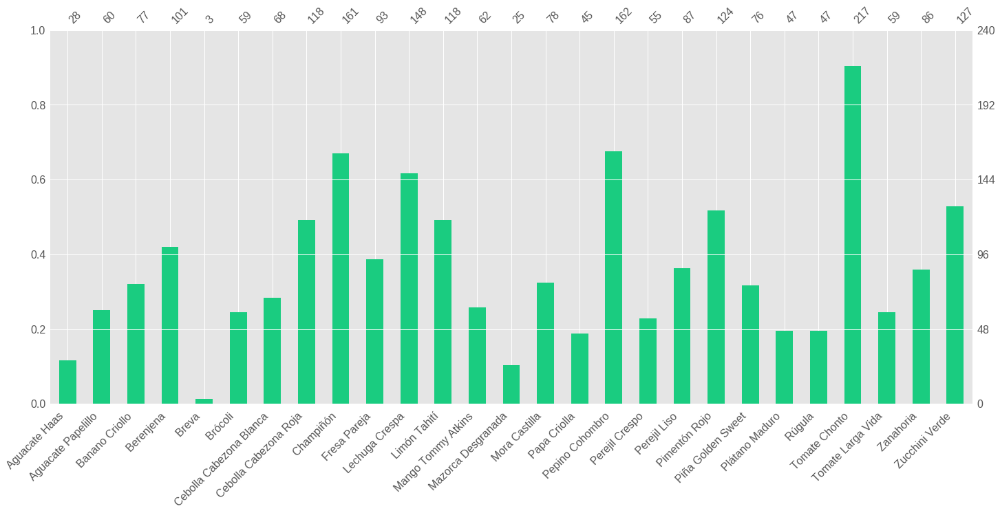

In [85]:
import missingno as msno
%matplotlib inline
print ("-----------------------------------")
print ("Cuantificación de valores faltantes por variable:""\n")
print(dataFinal.isnull().sum())
print ("                                            ***************************************")
print ("                                                       Missing Value Map")
print ("                                            ***************************************")
msno.bar(dataFinal.sample(240),color=(0.1, 0.8, 0.5))

In [122]:
##
dataFinal=dataFinal.fillna(0)
dataFinal.head()

,Aguacate Haas,Aguacate Papelillo,Banano Criollo,Berenjena,Breva,Brócoli,Cebolla Cabezona Blanca,Cebolla Cabezona Roja,Champiñón,Fresa Pareja,...,Perejil Crespo,Perejil Liso,Pimentón Rojo,Piña Golden Sweet,Plátano Maduro,Rúgula,Tomate Chonto,Tomate Larga Vida,Zanahoria,Zucchini Verde
Fecha,,,,,,,,,,,,,,,,,,,,,
2016-11-17,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2016-11-18,113.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,30.0,...,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0
2016-11-20,0.0,0.0,0.0,4.0,0.0,0.0,0.0,5.0,2.0,3.0,...,1.0,1.0,5.0,1.0,0.0,0.0,10.0,0.0,2.0,5.0
2016-11-21,0.0,0.0,2.0,5.0,0.0,0.0,2.0,1.0,1.0,0.0,...,0.0,2.0,9.0,0.0,0.0,0.0,8.0,0.0,2.0,5.0
2016-11-22,0.0,0.0,2.0,22.0,0.0,1.0,0.0,7.0,1.0,0.0,...,0.0,0.0,7.0,0.0,0.0,0.0,43.0,0.0,3.0,7.0


                                                           ***************************************
                                                          SERIE DEMANDA DE TIEMPO POR PRODUCTO PARETO
                                                           ***************************************


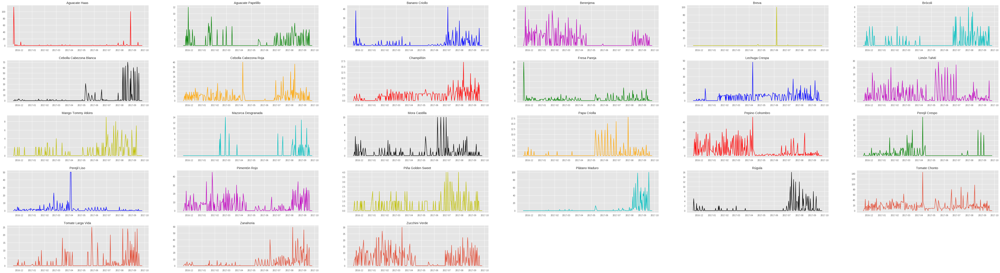

In [123]:
import itertools
import seaborn as sns

columns=['Aguacate Haas ', 'Aguacate Papelillo ', 'Banano Criollo ',
       'Berenjena ', 'Breva ', 'Brócoli ', 'Cebolla Cabezona Blanca ',
       'Cebolla Cabezona Roja ', 'Champiñón ', 'Fresa Pareja ',
       'Lechuga Crespa ', 'Limón Tahití ', 'Mango Tommy Atkins ',
       'Mazorca Desgranada ', 'Mora Castilla ', 'Papa Criolla ',
       'Pepino Cohombro ', 'Perejil Crespo ', 'Perejil Liso ',
       'Pimentón Rojo ', 'Piña Golden Sweet ', 'Plátano Maduro ', 'Rúgula ',
       'Tomate Chonto ', 'Tomate Larga Vida ', 'Zanahoria ',
       'Zucchini Verde ']

length  = len(columns)
colors  = ["r","g","b","m","y","c","k","orange","r","g","b","m","y","c","k","orange","r","g","b","m","y","c","k"] 

plt.figure(figsize=(80,40))
for i,j,k in itertools.zip_longest(columns,range(length),colors):
    plt.subplot(length/3,length/4,j+1)
    plt.plot(dataFinal[i],color=k)
    plt.title(i)
    plt.subplots_adjust(hspace = .3)
    #plt.axvline(data[i].mean(),color = "k",linestyle="dashed",label="MEAN")
    #plt.axvline(data[i].std(),color = "b",linestyle="dotted",label="STANDARD DEVIATION")
    #plt.legend(loc="upper right")
     
print ("                                                           ***************************************")
print ("                                                          SERIE DEMANDA DE TIEMPO POR PRODUCTO PARETO")
print ("                                                           ***************************************")

## LSTM Enfoque  Sequence to Sequence 

In [124]:
###
dataFinal2=dataFinal.T
dataFinal2.head()

Fecha,2016-11-17 00:00:00,2016-11-18 00:00:00,2016-11-20 00:00:00,2016-11-21 00:00:00,2016-11-22 00:00:00,2016-11-23 00:00:00,2016-11-24 00:00:00,2016-11-25 00:00:00,2016-11-26 00:00:00,2016-11-27 00:00:00,...,2017-09-16 00:00:00,2017-09-17 00:00:00,2017-09-18 00:00:00,2017-09-19 00:00:00,2017-09-20 00:00:00,2017-09-21 00:00:00,2017-09-22 00:00:00,2017-09-23 00:00:00,2017-09-24 00:00:00,2017-09-25 00:00:00
Aguacate Haas,5.0,113.0,0.0,0.0,0.0,3.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Aguacate Papelillo,0.0,0.0,0.0,0.0,0.0,3.0,0.0,5.0,0.0,3.0,...,4.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Banano Criollo,0.0,5.0,0.0,2.0,2.0,38.0,0.0,9.0,0.0,2.0,...,4.0,0.0,19.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Berenjena,0.0,0.0,4.0,5.0,22.0,0.0,11.0,0.0,0.0,7.0,...,3.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Breva,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [125]:
###
dataFinal3=dataFinal2.reset_index()
dataFinal3.head()

Fecha,index,2016-11-17 00:00:00,2016-11-18 00:00:00,2016-11-20 00:00:00,2016-11-21 00:00:00,2016-11-22 00:00:00,2016-11-23 00:00:00,2016-11-24 00:00:00,2016-11-25 00:00:00,2016-11-26 00:00:00,...,2017-09-16 00:00:00,2017-09-17 00:00:00,2017-09-18 00:00:00,2017-09-19 00:00:00,2017-09-20 00:00:00,2017-09-21 00:00:00,2017-09-22 00:00:00,2017-09-23 00:00:00,2017-09-24 00:00:00,2017-09-25 00:00:00
0,Aguacate Haas,5.0,113.0,0.0,0.0,0.0,3.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Aguacate Papelillo,0.0,0.0,0.0,0.0,0.0,3.0,0.0,5.0,0.0,...,4.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Banano Criollo,0.0,5.0,0.0,2.0,2.0,38.0,0.0,9.0,0.0,...,4.0,0.0,19.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Berenjena,0.0,0.0,4.0,5.0,22.0,0.0,11.0,0.0,0.0,...,3.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Breva,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [13]:
data_start_date = dataFinal3.columns[1]
data_end_date = dataFinal3.columns[-1]
print('Data ranges from %s to %s' % (data_start_date, data_end_date))

Data ranges from 2016-11-17 00:00:00 to 2017-09-25 00:00:00


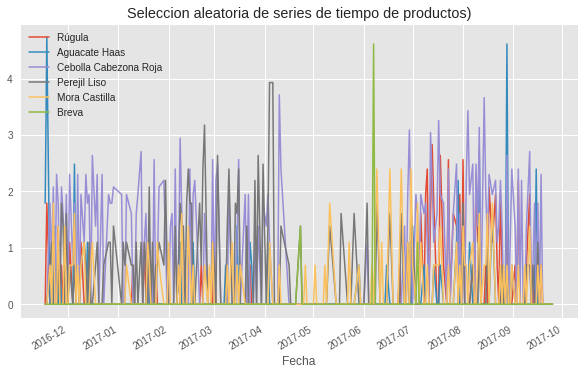

In [14]:
def plot_random_series(df, n_series):
    
    sample = df.sample(n_series, random_state=8)
    page_labels = sample['index'].tolist()
    series_samples = sample.loc[:,data_start_date:data_end_date]
    
    plt.figure(figsize=(10,6))
    
    for i in range(series_samples.shape[0]):
        np.log1p(pd.Series(series_samples.iloc[i]).astype(np.float64)).plot(linewidth=1.5)
    
    plt.title('Seleccion aleatoria de series de tiempo de productos)')
    plt.legend(page_labels)
    
plot_random_series(dataFinal3, 6)

In [0]:
from datetime import timedelta

pred_steps = 15
pred_length=timedelta(pred_steps)

first_day = pd.to_datetime(data_start_date) 
last_day = pd.to_datetime(data_end_date)

val_pred_start = last_day - pred_length + timedelta(1)
val_pred_end = last_day

train_pred_start = val_pred_start - pred_length
train_pred_end = val_pred_start - timedelta(days=1)

In [0]:
enc_length = train_pred_start - first_day

train_enc_start = first_day
train_enc_end = train_enc_start + enc_length - timedelta(1)

val_enc_start = train_enc_start + pred_length
val_enc_end = val_enc_start + enc_length - timedelta(1)

In [17]:
print('Train encoding:', train_enc_start, '-', train_enc_end)
print('Train prediction:', train_pred_start, '-', train_pred_end, '\n')
print('Val encoding:', val_enc_start, '-', val_enc_end)
print('Val prediction:', val_pred_start, '-', val_pred_end)

print('\nEncoding interval:', enc_length.days)
print('Prediction interval:', pred_length.days)

Train encoding: 2016-11-17 00:00:00 - 2017-08-26 00:00:00
Train prediction: 2017-08-27 00:00:00 - 2017-09-10 00:00:00 

Val encoding: 2016-12-02 00:00:00 - 2017-09-10 00:00:00
Val prediction: 2017-09-11 00:00:00 - 2017-09-25 00:00:00

Encoding interval: 283
Prediction interval: 15


In [0]:
df=dataFinal3

date_to_index = pd.Series(index=pd.Index([pd.to_datetime(c) for c in df.columns[1:]]),
                          data=[i for i in range(len(df.columns[1:]))])

series_array = df[df.columns[1:]].values

def get_time_block_series(series_array, date_to_index, start_date, end_date):
    
    inds = date_to_index[start_date:end_date]
    return series_array[:,inds]

def transform_series_encode(series_array):
    
    series_array = np.log1p(np.nan_to_num(series_array)) # filling NaN with 0
    series_mean = series_array.mean(axis=1).reshape(-1,1) 
    series_array = series_array - series_mean
    series_array = series_array.reshape((series_array.shape[0],series_array.shape[1], 1))
    
    return series_array, series_mean

def transform_series_decode(series_array, encode_series_mean):
    
    series_array = np.log1p(np.nan_to_num(series_array)) # filling NaN with 0
    series_array = series_array - encode_series_mean
    series_array = series_array.reshape((series_array.shape[0],series_array.shape[1], 1))
    
    return series_array

In [0]:
from keras.models import Model
from keras.layers import Input, LSTM, Dense
from keras.optimizers import Adam

latent_dim = 64 # LSTM hidden units
dropout = 0.2

# Define an input series and encode it with an LSTM. 
encoder_inputs = Input(shape=(None, 1)) 
encoder = LSTM(latent_dim, dropout=dropout, return_state=True)
encoder_outputs, state_h, state_c = encoder(encoder_inputs)

# We discard `encoder_outputs` and only keep the final states. These represent the "context"
# vector that we use as the basis for decoding.
encoder_states = [state_h, state_c]

# Set up the decoder, using `encoder_states` as initial state.
# This is where teacher forcing inputs are fed in.
decoder_inputs = Input(shape=(None, 1)) 

# We set up our decoder using `encoder_states` as initial state.  
# We return full output sequences and return internal states as well. 
# We don't use the return states in the training model, but we will use them in inference.
decoder_lstm = LSTM(latent_dim, dropout=dropout, return_sequences=True, return_state=True)
decoder_outputs, _, _ = decoder_lstm(decoder_inputs,
                                     initial_state=encoder_states)

decoder_dense = Dense(1) # 1 continuous output at each timestep
decoder_outputs = decoder_dense(decoder_outputs)

# Define the model that will turn
# `encoder_input_data` & `decoder_input_data` into `decoder_target_data`
model = Model([encoder_inputs, decoder_inputs], decoder_outputs)

In [29]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, None, 1)      0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            (None, None, 1)      0                                            
__________________________________________________________________________________________________
lstm_3 (LSTM)                   [(None, 64), (None,  16896       input_3[0][0]                    
__________________________________________________________________________________________________
lstm_4 (LSTM)                   [(None, None, 64), ( 16896       input_4[0][0]                    
                                                                 lstm_3[0][1]                     
          

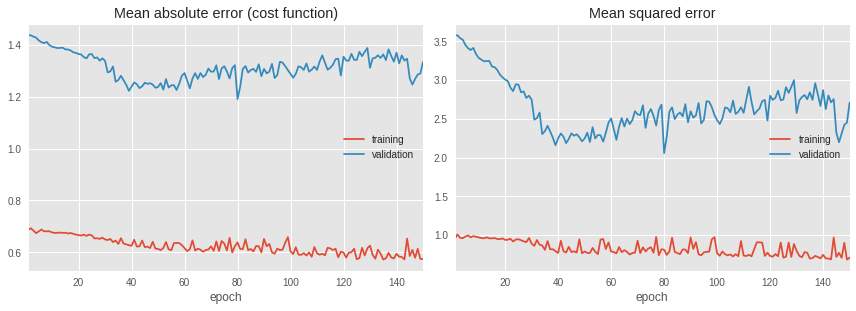

In [30]:
from livelossplot import PlotLossesKeras
first_n_samples = 20000
batch_size = 1
epochs = 150

# sample of series from train_enc_start to train_enc_end  
encoder_input_data = get_time_block_series(series_array, date_to_index, 
                                           train_enc_start, train_enc_end)[:first_n_samples]
encoder_input_data, encode_series_mean = transform_series_encode(encoder_input_data)

# sample of series from train_pred_start to train_pred_end 
decoder_target_data = get_time_block_series(series_array, date_to_index, 
                                            train_pred_start, train_pred_end)[:first_n_samples]
decoder_target_data = transform_series_decode(decoder_target_data, encode_series_mean)

# lagged target series for teacher forcing
decoder_input_data = np.zeros(decoder_target_data.shape)
decoder_input_data[:,1:,0] = decoder_target_data[:,:-1,0]
decoder_input_data[:,0,0] = encoder_input_data[:,-1,0]

model.compile(Adam(lr=0.0001), loss='mean_absolute_error',metrics=['mse'])
history = model.fit([encoder_input_data, decoder_input_data], decoder_target_data,
                     batch_size=batch_size,
                     epochs=epochs,
                     validation_split=0.2,callbacks=([PlotLossesKeras()]))

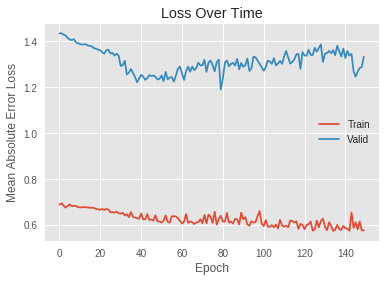

In [31]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.xlabel('Epoch')
plt.ylabel('Mean Absolute Error Loss')
plt.title('Loss Over Time')
plt.legend(['Train','Valid'])

In [0]:
# from our previous model - mapping encoder sequence to state vectors
encoder_model = Model(encoder_inputs, encoder_states)

# A modified version of the decoding stage that takes in predicted target inputs
# and encoded state vectors, returning predicted target outputs and decoder state vectors.
# We need to hang onto these state vectors to run the next step of the inference loop.
decoder_state_input_h = Input(shape=(latent_dim,))
decoder_state_input_c = Input(shape=(latent_dim,))
decoder_states_inputs = [decoder_state_input_h, decoder_state_input_c]

decoder_outputs, state_h, state_c = decoder_lstm(decoder_inputs, initial_state=decoder_states_inputs)
decoder_states = [state_h, state_c]

decoder_outputs = decoder_dense(decoder_outputs)
decoder_model = Model([decoder_inputs] + decoder_states_inputs,
                      [decoder_outputs] + decoder_states)

def decode_sequence(input_seq):
    
    # Encode the input as state vectors.
    states_value = encoder_model.predict(input_seq)

    # Generate empty target sequence of length 1.
    target_seq = np.zeros((1, 1, 1))
    
    # Populate the first target sequence with end of encoding series pageviews
    target_seq[0, 0, 0] = input_seq[0, -1, 0]

    # Sampling loop for a batch of sequences - we will fill decoded_seq with predictions
    # (to simplify, here we assume a batch of size 1).

    decoded_seq = np.zeros((1,pred_steps,1))
    
    for i in range(pred_steps):
        
        output, h, c = decoder_model.predict([target_seq] + states_value)
        
        decoded_seq[0,i,0] = output[0,0,0]

        # Update the target sequence (of length 1).
        target_seq = np.zeros((1, 1, 1))
        target_seq[0, 0, 0] = output[0,0,0]

        # Update states
        states_value = [h, c]

    return decoded_seq

In [0]:
encoder_input_data = get_time_block_series(series_array, date_to_index, val_enc_start, val_enc_end)
encoder_input_data, encode_series_mean = transform_series_encode(encoder_input_data)

decoder_target_data = get_time_block_series(series_array, date_to_index, val_pred_start, val_pred_end)
decoder_target_data = transform_series_decode(decoder_target_data, encode_series_mean)

In [0]:
def predict_and_plot(encoder_input_data, decoder_target_data, sample_ind, enc_tail_len=306):

    encode_series = encoder_input_data[sample_ind:sample_ind+1,:,:] 
    pred_series = decode_sequence(encode_series)
    
    encode_series = encode_series.reshape(-1,1)
    pred_series = pred_series.reshape(-1,1)   
    target_series = decoder_target_data[sample_ind,:,:1].reshape(-1,1) 
    
    pred_series= pred_series+encode_series_mean[sample_ind]
    pred_series= np.expm1(pred_series)
    pred_series[pred_series<0] = 0
    
    target_series= target_series+encode_series_mean[sample_ind] 
    target_series= np.expm1( target_series)
    target_series[target_series<0] = 0
    
    
    encode_series_tail = np.concatenate([encode_series[-enc_tail_len:],target_series[:1]])
    x_encode = encode_series_tail.shape[0]
    
    encode_series_tail= encode_series_tail+encode_series_mean[sample_ind]
    encode_series_tail= np.expm1(encode_series_tail)
    encode_series_tail[encode_series_tail<0] = 0
    
    plt.figure(figsize=(17,8))
    
    plt.plot(range(1,x_encode+1),encode_series_tail,color='blue')
    plt.plot(range(x_encode,x_encode+pred_steps),pred_series,color='red',linestyle='--')
    plt.plot(range(x_encode,x_encode+pred_steps),target_series,color='orange')
    
    
    plt.title(' Modelo LSTM Serie de tiempo Demanda Pepino Cohombro + Predicciones 7 dias')
    plt.legend(['Encoding Series',"Target Series",'Predictions'])
    
    predicciones=pd.DataFrame(pred_series,columns=["Predicciones Precio"],index=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15])
    predicciones=round(predicciones,0)
    
    return predicciones

,Predicciones Precio
1,0.0
2,0.0
3,0.0
4,0.0
5,0.0
6,0.0
7,0.0
8,0.0
9,0.0
10,0.0


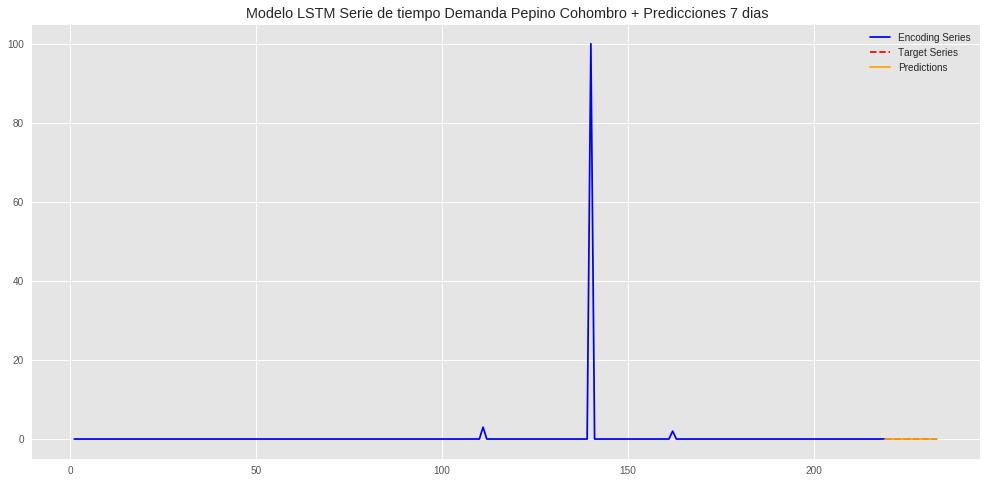

In [60]:
predict_and_plot(encoder_input_data, decoder_target_data,4)

## Convoluciones 1D Causales Dilatadas

In [126]:
data_start_date = dataFinal3.columns[1]
data_end_date = dataFinal3.columns[-1]
print('Data ranges from %s to %s' % (data_start_date, data_end_date))

Data ranges from 2016-11-17 00:00:00 to 2017-09-25 00:00:00


In [0]:
from datetime import timedelta

pred_steps = 7
pred_length=timedelta(pred_steps)

first_day = pd.to_datetime(data_start_date) 
last_day = pd.to_datetime(data_end_date)

val_pred_start = last_day - pred_length + timedelta(1)
val_pred_end = last_day

train_pred_start = val_pred_start - pred_length
train_pred_end = val_pred_start - timedelta(days=1)

In [0]:
enc_length = train_pred_start - first_day

train_enc_start = first_day
train_enc_end = train_enc_start + enc_length - timedelta(1)

val_enc_start = train_enc_start + pred_length
val_enc_end = val_enc_start + enc_length - timedelta(1)

In [129]:
print('Train encoding:', train_enc_start, '-', train_enc_end)
print('Train prediction:', train_pred_start, '-', train_pred_end, '\n')
print('Val encoding:', val_enc_start, '-', val_enc_end)
print('Val prediction:', val_pred_start, '-', val_pred_end)

print('\nEncoding interval:', enc_length.days)
print('Prediction interval:', pred_length.days)

Train encoding: 2016-11-17 00:00:00 - 2017-09-11 00:00:00
Train prediction: 2017-09-12 00:00:00 - 2017-09-18 00:00:00 

Val encoding: 2016-11-24 00:00:00 - 2017-09-18 00:00:00
Val prediction: 2017-09-19 00:00:00 - 2017-09-25 00:00:00

Encoding interval: 299
Prediction interval: 7


In [0]:
df=dataFinal3
date_to_index = pd.Series(index=pd.Index([pd.to_datetime(c) for c in df.columns[1:]]),
                          data=[i for i in range(len(df.columns[1:]))])

series_array = df[df.columns[1:]].values

def get_time_block_series(series_array, date_to_index, start_date, end_date):
    
    inds = date_to_index[start_date:end_date]
    return series_array[:,inds]

def transform_series_encode(series_array):
    
    series_array = np.log1p(np.nan_to_num(series_array)) # filling NaN with 0
    series_mean = series_array.mean(axis=1).reshape(-1,1) 
    series_array = series_array - series_mean
    series_array = series_array.reshape((series_array.shape[0],series_array.shape[1], 1))
    
    return series_array, series_mean

def transform_series_decode(series_array, encode_series_mean):
    
    series_array = np.log1p(np.nan_to_num(series_array)) # filling NaN with 0
    series_array = series_array - encode_series_mean
    series_array = series_array.reshape((series_array.shape[0],series_array.shape[1], 1))
    
    return series_array

In [0]:
from keras.models import Model
from keras.layers import Input, Conv1D, Dense, Dropout, Lambda, concatenate
from keras.optimizers import Adam
from keras.layers import Activation, Dense

# convolutional layer parameters
n_filters = 32 
filter_width = 2
dilation_rates = [2**i for i in range(5)] 

# define an input history series and pass it through a stack of dilated causal convolutions. 
history_seq = Input(shape=(None, 1))
x = history_seq

for dilation_rate in dilation_rates:
    x = Conv1D(filters=n_filters,
               kernel_size=filter_width, 
               padding='causal',
               dilation_rate=dilation_rate)(x)

x = Dense(256, activation='relu')(x)
x = Dropout(.2)(x)
x = Dense(1,activation='linear')(x)

# extract the last 7 time steps as the training target
def slice(x, seq_length):
    return x[:,-seq_length:,:]

pred_seq_train = Lambda(slice, arguments={'seq_length':7})(x)

model = Model(history_seq, pred_seq_train)

In [135]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_11 (InputLayer)        (None, None, 1)           0         
_________________________________________________________________
conv1d_21 (Conv1D)           (None, None, 32)          96        
_________________________________________________________________
conv1d_22 (Conv1D)           (None, None, 32)          2080      
_________________________________________________________________
conv1d_23 (Conv1D)           (None, None, 32)          2080      
_________________________________________________________________
conv1d_24 (Conv1D)           (None, None, 32)          2080      
_________________________________________________________________
conv1d_25 (Conv1D)           (None, None, 32)          2080      
_________________________________________________________________
dense_11 (Dense)             (None, None, 256)         8448      
__________

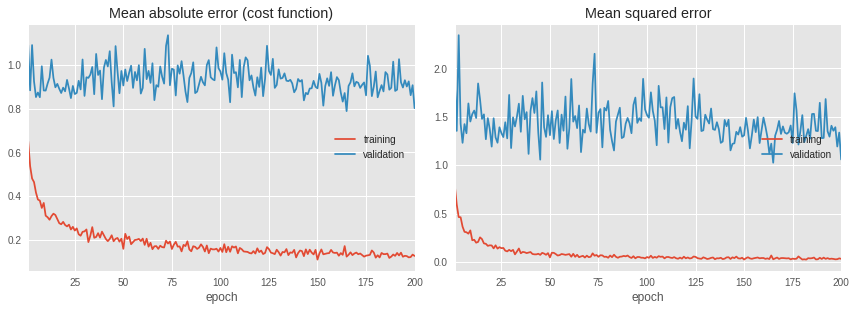

In [136]:
from keras.optimizers import adam
from keras.optimizers import SGD
from keras.optimizers import adamax
from keras.optimizers import adadelta
from keras.optimizers import RMSprop,nadam
from livelossplot import PlotLossesKeras
from google.colab import files

first_n_samples = 27
batch_size = 1
epochs = 200

# sample of series from train_enc_start to train_enc_end  
encoder_input_data = get_time_block_series(series_array, date_to_index, 
                                           train_enc_start, train_enc_end)[:first_n_samples]
encoder_input_data, encode_series_mean = transform_series_encode(encoder_input_data)

# sample of series from train_pred_start to train_pred_end 
decoder_target_data = get_time_block_series(series_array, date_to_index, 
                                            train_pred_start, train_pred_end)[:first_n_samples]
decoder_target_data = transform_series_decode(decoder_target_data, encode_series_mean)

# we append a lagged history of the target series to the input data, 
# so that we can train with teacher forcing
lagged_target_history = decoder_target_data[:,:-1,:1]
encoder_input_data = np.concatenate([encoder_input_data, lagged_target_history], axis=1)

model.compile(nadam(lr=0.001), loss='mean_absolute_error',metrics=['mse'])
history = model.fit(encoder_input_data, decoder_target_data,
                    batch_size=batch_size,
                    epochs=epochs,
                    validation_split=0.2,callbacks=([PlotLossesKeras()]))

#model.save('TS_Demanda_Conv1D.h5')

#files.download('TS_Demanda_Conv1D.h5')

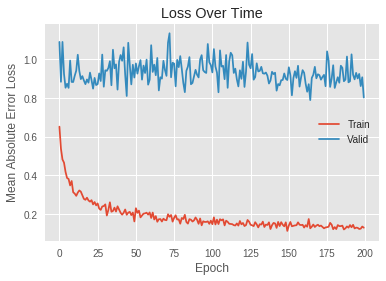

In [137]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.xlabel('Epoch')
plt.ylabel('Mean Absolute Error Loss')
plt.title('Loss Over Time')
plt.legend(['Train','Valid'])

In [0]:
def predict_sequence(input_sequence):

    history_sequence = input_sequence.copy()
    pred_sequence = np.zeros((1,pred_steps,1)) # initialize output (pred_steps time steps)  
    
    for i in range(pred_steps):
        
        # record next time step prediction (last time step of model output) 
        last_step_pred = model.predict(history_sequence)[0,-1,0]
        pred_sequence[0,i,0] = last_step_pred
        
        # add the next time step prediction to the history sequence
        history_sequence = np.concatenate([history_sequence, 
                                           last_step_pred.reshape(-1,1,1)], axis=1)

    return pred_sequence

In [0]:
encoder_input_data = get_time_block_series(series_array, date_to_index, val_enc_start, val_enc_end)
encoder_input_data, encode_series_mean = transform_series_encode(encoder_input_data)

decoder_target_data = get_time_block_series(series_array, date_to_index, val_pred_start, val_pred_end)
decoder_target_data = transform_series_decode(decoder_target_data, encode_series_mean)

In [0]:
def predict_and_plot(encoder_input_data, decoder_target_data, sample_ind, enc_tail_len=306):

    encode_series = encoder_input_data[sample_ind:sample_ind+1,:,:] 
    pred_series = predict_sequence(encode_series)
    
    encode_series = encode_series.reshape(-1,1)
    pred_series = pred_series.reshape(-1,1)   
    target_series = decoder_target_data[sample_ind,:,:1].reshape(-1,1) 
    
    pred_series= pred_series+encode_series_mean[sample_ind]
    pred_series= np.expm1(pred_series)
    pred_series[pred_series<0] = 0
    
    target_series= target_series+encode_series_mean[sample_ind] 
    target_series= np.expm1( target_series)
    target_series[target_series<0] = 0
    
    
    encode_series_tail = np.concatenate([encode_series[-enc_tail_len:],target_series[:1]])
    x_encode = encode_series_tail.shape[0]
    
    encode_series_tail= encode_series_tail+encode_series_mean[sample_ind]
    encode_series_tail= np.expm1(encode_series_tail)
    encode_series_tail[encode_series_tail<0] = 0
    
    plt.figure(figsize=(18,8))
    
    plt.plot(range(1,x_encode+1),encode_series_tail,color='blue')
    plt.plot(range(x_encode,x_encode+pred_steps),pred_series,color='red',linestyle='--')
    plt.plot(range(x_encode,x_encode+pred_steps),target_series,color='orange')
    
    
    plt.title('Modelo Conv1d Serie de tiempo Demanda papa criolla + Predicciones 7 dias')
    plt.legend(['Encoding Series','Predictions',"Target Series"])
    
    predicciones=pd.DataFrame(pred_series,columns=["Predicciones Demanda"],index=[1,2,3,4,5,6,7])
    predicciones=round(predicciones,0)
    
    return predicciones


***********************************************************************************************************************************
                                                      PREDICCIONES DEMANDA PRODUCTOS PARETO                                                
***********************************************************************************************************************************




,Predicciones Demanda
1,1.0
2,1.0
3,1.0
4,0.0
5,0.0
6,0.0
7,0.0


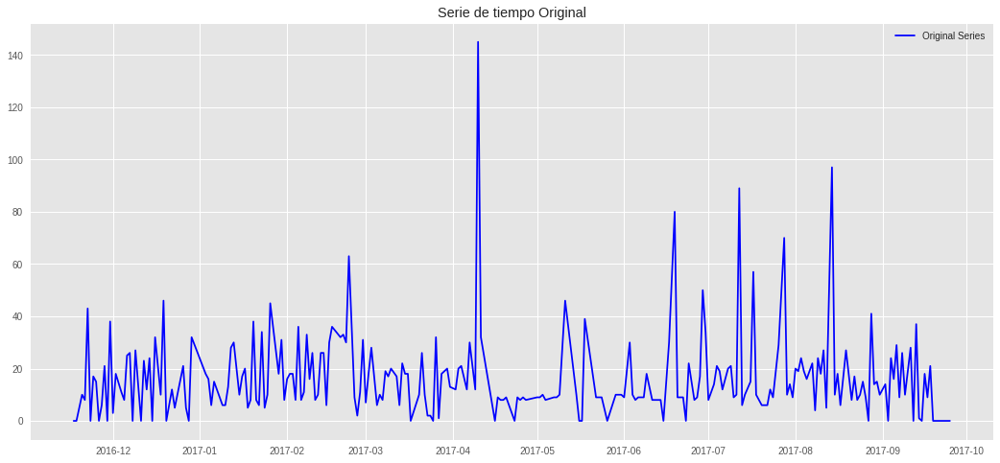

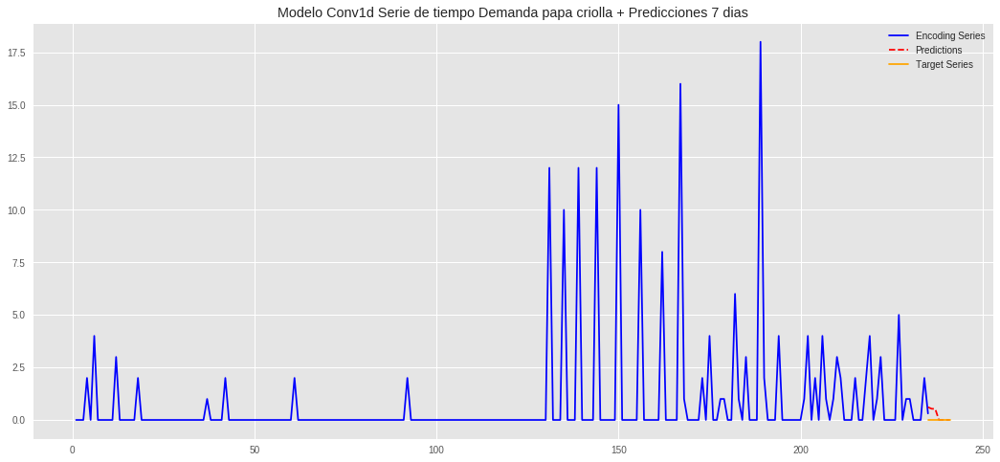

In [143]:
print("")
print("***********************************************************************************************************************************")
print("                                                      PREDICCIONES DEMANDA PRODUCTOS PARETO                                                ")
print("***********************************************************************************************************************************")
print("")
plt.figure(figsize=(18,8))
plt.plot(dataFinal.iloc[:,23:24],color='blue') 
plt.title('Serie de tiempo Original')
plt.legend(['Original Series'])
print("")
predict_and_plot(encoder_input_data, decoder_target_data,15)


In [254]:
dataFinal.columns

Index(['Aguacate Haas ', 'Aguacate Papelillo ', 'Banano Criollo ',
       'Berenjena ', 'Breva ', 'Brócoli ', 'Cebolla Cabezona Blanca ',
       'Cebolla Cabezona Roja ', 'Champiñón ', 'Fresa Pareja ',
       'Lechuga Crespa ', 'Limón Tahití ', 'Mango Tommy Atkins ',
       'Mazorca Desgranada ', 'Mora Castilla ', 'Papa Criolla ',
       'Pepino Cohombro ', 'Perejil Crespo ', 'Perejil Liso ',
       'Pimentón Rojo ', 'Piña Golden Sweet ', 'Plátano Maduro ', 'Rúgula ',
       'Tomate Chonto ', 'Tomate Larga Vida ', 'Zanahoria ',
       'Zucchini Verde '],
      dtype='object')

# Modelo Predictivo Precio

In [144]:
import pandas as pd
data = pd.read_csv("DatosAgro.txt", delimiter="\t",sep=" ", usecols=[0,1,2,3,4,5]) 
data["Nombre_producto"],data["Cantidad"] = data["Nombre_producto"].str.split("/",1).str
data.head()

,Cliente,Fecha,Pedido,Precio,Producto,Nombre_producto,Cantidad
0,Cliente26,18/09/2017,20,700,VER0049,Yerbabuena,100 gramos
1,Cliente26,18/09/2017,10,1200,FRU0024,Limón Tahití,Libra
2,Cliente26,18/09/2017,4,1600,VER0041,Puerro,Libra
3,Cliente26,18/09/2017,10,1500,VER0038,Pimentón Rojo,Libra
4,Cliente26,18/09/2017,8,1100,VER0010,Zucchini Verde,Libra


In [9]:
data["Pedido"].groupby(data["Nombre_producto"]).describe()

,count,mean,std,min,25%,50%,75%,max
Nombre_producto,,,,,,,,
Acelga,9.0,2.888889,2.848001,1.0,1.00,2.0,3.00,10.0
Agraz,10.0,2.200000,2.780887,1.0,1.00,1.0,2.00,10.0
Aguacate Haas,30.0,10.000000,26.148119,1.0,1.25,2.0,4.75,111.0
Aguacate Papelillo,72.0,3.180556,1.706049,1.0,2.00,3.0,4.00,12.0
Ahuyama,47.0,5.765957,9.842704,1.0,2.00,4.0,6.00,50.0
Ajo Importado,18.0,1.111111,0.471405,1.0,1.00,1.0,1.00,3.0
Ajo Nacional,3.0,1.333333,0.577350,1.0,1.00,1.0,1.50,2.0
Ají Chirca,2.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
Ají Jalapeño,9.0,2.222222,2.990726,1.0,1.00,1.0,1.00,10.0


In [0]:
columns=['Aguacate Haas ', 'Aguacate Papelillo ', 'Banano Criollo ',
       'Berenjena ', 'Breva ', 'Brócoli ', 'Cebolla Cabezona Blanca ',
       'Cebolla Cabezona Roja ', 'Champiñón ', 'Fresa Pareja ',
       'Lechuga Crespa ', 'Limón Tahití ', 'Mango Tommy Atkins ',
       'Mazorca Desgranada ', 'Mora Castilla ', 'Papa Criolla ',
       'Pepino Cohombro ', 'Perejil Crespo ', 'Perejil Liso ',
       'Pimentón Rojo ', 'Piña Golden Sweet ', 'Plátano Maduro ', 'Rúgula ',
       'Tomate Chonto ', 'Tomate Larga Vida ', 'Zanahoria ',
       'Zucchini Verde ']

In [11]:
columns = pd.DataFrame(columns)
#columns.head()
columns.columns = ["Nombre_producto"]
Missing_Days = pd.merge(columns, data, on='Nombre_producto', how='left')
#Missing_Days.head()
Missing_Days["Pedido"].groupby(Missing_Days["Nombre_producto"]).describe()

,count,mean,std,min,25%,50%,75%,max
Nombre_producto,,,,,,,,
Aguacate Haas,30.0,10.000000,26.148119,1.0,1.25,2.0,4.75,111.0
Aguacate Papelillo,72.0,3.180556,1.706049,1.0,2.00,3.0,4.00,12.0
Banano Criollo,95.0,5.452632,5.236469,1.0,2.00,4.0,7.50,38.0
Berenjena,129.0,5.193798,2.883351,1.0,4.00,4.0,6.00,16.0
Breva,4.0,26.250000,49.175705,1.0,1.00,2.0,27.25,100.0
Brócoli,67.0,2.358209,1.494449,1.0,1.00,2.0,3.00,8.0
Cebolla Cabezona Blanca,85.0,10.282353,18.765224,1.0,1.00,2.0,10.00,70.0
Cebolla Cabezona Roja,143.0,6.000000,5.451450,1.0,3.00,5.0,8.00,36.0
Champiñón,204.0,2.681373,1.256097,1.0,2.00,3.0,3.00,15.0


In [17]:
from google.colab import files
table_precio = pd.pivot_table(Missing_Days, values='Precio', index=['Fecha'],columns=['Nombre_producto'], aggfunc=np.average)
table_precio=table_precio.reset_index()
table_precio["Fecha"]=pd.to_datetime(table_precio["Fecha"], format="%d/%m/%Y")
table_precio=table_precio.sort_values("Fecha",ascending=True)
table_precio=table_precio.set_index(['Fecha'])
table_precio
#table_precio.to_csv("precio.csv")
#files.download('precio.csv')

Nombre_producto,Aguacate Haas,Aguacate Papelillo,Banano Criollo,Berenjena,Breva,Brócoli,Cebolla Cabezona Blanca,Cebolla Cabezona Roja,Champiñón,Fresa Pareja,...,Perejil Crespo,Perejil Liso,Pimentón Rojo,Piña Golden Sweet,Plátano Maduro,Rúgula,Tomate Chonto,Tomate Larga Vida,Zanahoria,Zucchini Verde
Fecha,,,,,,,,,,,,,,,,,,,,,
2016-11-17,2000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-18,1600.0,NaN,800.0,NaN,NaN,NaN,NaN,NaN,NaN,2000.0,...,NaN,NaN,NaN,NaN,NaN,2800.0,NaN,NaN,NaN,NaN
2016-11-20,NaN,NaN,NaN,1120.0,NaN,NaN,NaN,1600.0,5600.0,2000.0,...,16000.0,2400.0,1600.0,13200.0,NaN,NaN,1100.0,NaN,600.0,600.0
2016-11-21,NaN,NaN,800.0,1120.0,NaN,NaN,1880.0,1000.0,5600.0,NaN,...,NaN,2400.0,1600.0,NaN,NaN,NaN,1100.0,NaN,600.0,600.0
2016-11-22,NaN,NaN,800.0,1120.0,NaN,2240.0,NaN,1000.0,5600.0,NaN,...,NaN,NaN,1600.0,NaN,NaN,NaN,1100.0,NaN,600.0,600.0
2016-11-23,2300.0,2200.0,800.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-24,NaN,NaN,NaN,1120.0,NaN,NaN,NaN,1000.0,NaN,2000.0,...,NaN,NaN,1600.0,NaN,NaN,NaN,1100.0,NaN,NaN,600.0
2016-11-25,NaN,2200.0,800.0,NaN,NaN,2000.0,1880.0,1000.0,5600.0,2000.0,...,NaN,2400.0,1600.0,NaN,NaN,2800.0,1100.0,NaN,500.0,600.0
2016-11-26,2300.0,NaN,NaN,NaN,NaN,NaN,1880.0,NaN,5600.0,NaN,...,NaN,NaN,NaN,2640.0,NaN,NaN,NaN,NaN,500.0,NaN


-----------------------------------
Cuantificación de valores faltantes por variable:

Nombre_producto
Aguacate Haas               212
Aguacate Papelillo          180
Banano Criollo              163
Berenjena                   139
Breva                       237
Brócoli                     181
Cebolla Cabezona Blanca     172
Cebolla Cabezona Roja       122
Champiñón                    79
Fresa Pareja                147
Lechuga Crespa               92
Limón Tahití                122
Mango Tommy Atkins          178
Mazorca Desgranada          215
Mora Castilla               162
Papa Criolla                195
Pepino Cohombro              78
Perejil Crespo              185
Perejil Liso                153
Pimentón Rojo               116
Piña Golden Sweet           164
Plátano Maduro              193
Rúgula                      193
Tomate Chonto                23
Tomate Larga Vida           181
Zanahoria                   154
Zucchini Verde              113
dtype: int64
                    

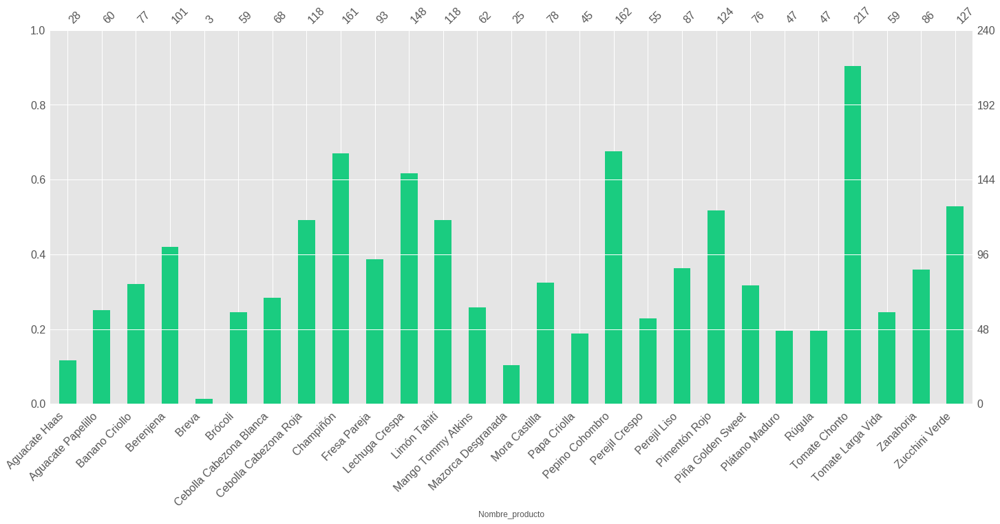

In [19]:
import missingno as msno
%matplotlib inline
print ("-----------------------------------")
print ("Cuantificación de valores faltantes por variable:""\n")
print(table_precio.isnull().sum())
print ("                                            ***************************************")
print ("                                                       Missing Value Map")
print ("                                            ***************************************")
msno.bar(table_precio.sample(240),color=(0.1, 0.8, 0.5))

                                                           ***************************************
                                                    SERIE DE TIEMPO PRECIO POR PRODUCTO PARETO
                                                           ***************************************


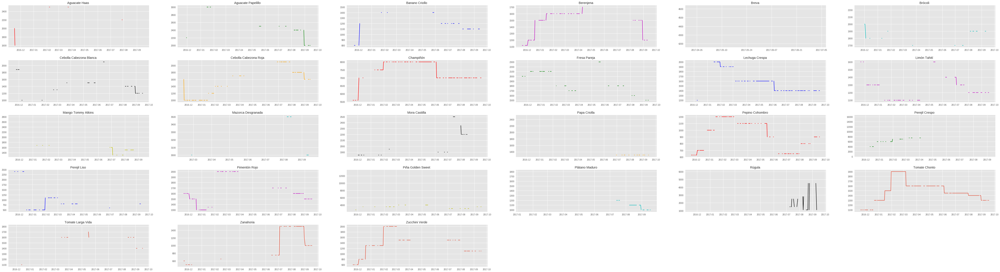

In [231]:
import itertools
import seaborn as sns

columns=['Aguacate Haas ', 'Aguacate Papelillo ', 'Banano Criollo ',
       'Berenjena ', 'Breva ', 'Brócoli ', 'Cebolla Cabezona Blanca ',
       'Cebolla Cabezona Roja ', 'Champiñón ', 'Fresa Pareja ',
       'Lechuga Crespa ', 'Limón Tahití ', 'Mango Tommy Atkins ',
       'Mazorca Desgranada ', 'Mora Castilla ', 'Papa Criolla ',
       'Pepino Cohombro ', 'Perejil Crespo ', 'Perejil Liso ',
       'Pimentón Rojo ', 'Piña Golden Sweet ', 'Plátano Maduro ', 'Rúgula ',
       'Tomate Chonto ', 'Tomate Larga Vida ', 'Zanahoria ',
       'Zucchini Verde ']

length  = len(columns)
colors  = ["r","g","b","m","y","c","k","orange","r","g","b","m","y","c","k","orange","r","g","b","m","y","c","k"] 

plt.figure(figsize=(80,40))
for i,j,k in itertools.zip_longest(columns,range(length),colors):
    plt.subplot(length/3,length/4,j+1)
    plt.plot(table_precio[i],color=k)
    plt.title(i)
    plt.subplots_adjust(hspace = .3)
    #plt.axvline(data[i].mean(),color = "k",linestyle="dashed",label="MEAN")
    #plt.axvline(data[i].std(),color = "b",linestyle="dotted",label="STANDARD DEVIATION")
    #plt.legend(loc="upper right")
     
print ("                                                           ***************************************")
print ("                                                    SERIE DE TIEMPO PRECIO POR PRODUCTO PARETO")
print ("                                                           ***************************************")

In [145]:
data_Precio18=pd.read_excel('precio_impute0918.xlsx')
data_Precio25=pd.read_excel('precio_impute0925.xlsx')
data_Precio18=data_Precio18.set_index("Fecha")
data_Precio25=data_Precio25.set_index("Fecha")
data_Precio18.head()
data_Precio25.head()

,Aguacate.Haas,Aguacate.Papelillo,Banano.Criollo,Berenjena,Breva,BrÃ³coli,Cebolla.Cabezona.Blanca,Cebolla.Cabezona.Roja,ChampiÃ.Ã³n,Fresa.Pareja,...,Perejil.Crespo,Perejil.Liso,PimentÃ³n.Rojo,PiÃ.a.Golden.Sweet,PlÃ.tano.Maduro,RÃºgula,Tomate.Chonto,Tomate.Larga.Vida,Zanahoria,Zucchini.Verde
Fecha,,,,,,,,,,,,,,,,,,,,,
2016-11-17,2000,2500,800,1600,4400,1700,1500,1800,8000,1700,...,7500,800,2000,3000,1000,2500,1600,1600,500,1500
2016-11-18,1600,2400,800,1600,4400,1700,2100,1000,7000,2000,...,7500,500,1600,3000,1200,2800,1450,1600,1500,600
2016-11-20,2200,2000,800,1120,4400,1900,1880,1600,5600,2000,...,16000,2400,1600,13200,1200,2800,1100,1600,600,600
2016-11-21,2200,2200,800,1120,4400,1900,1880,1000,5600,1800,...,3800,2400,1600,2640,1000,2800,1100,1600,600,600
2016-11-22,2500,2200,800,1120,4400,2240,1200,1000,5600,2000,...,6000,2400,1600,3500,1000,2800,1100,1100,600,600


                                                           ***************************************
                                                    SERIE DE TIEMPO PRECIO POR PRODUCTO PARETO
                                                           ***************************************


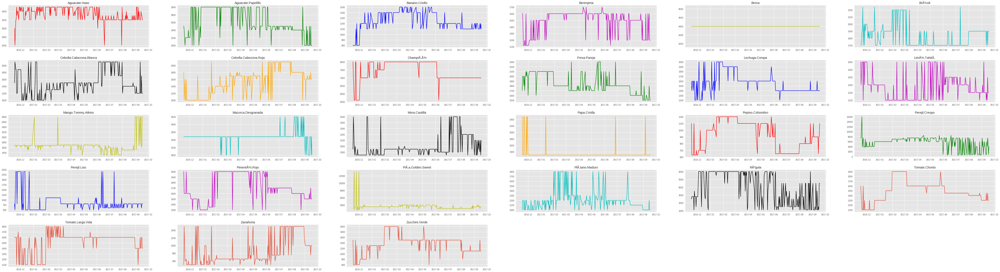

In [240]:
import itertools
import seaborn as sns

columns=['Aguacate.Haas', 'Aguacate.Papelillo', 'Banano.Criollo', 'Berenjena',
       'Breva', 'BrÃ³coli', 'Cebolla.Cabezona.Blanca', 'Cebolla.Cabezona.Roja',
       'ChampiÃ.Ã³n', 'Fresa.Pareja', 'Lechuga.Crespa', 'LimÃ³n.TahitÃ.',
       'Mango.Tommy.Atkins', 'Mazorca.Desgranada', 'Mora.Castilla',
       'Papa.Criolla', 'Pepino.Cohombro', 'Perejil.Crespo', 'Perejil.Liso',
       'PimentÃ³n.Rojo', 'PiÃ.a.Golden.Sweet', 'PlÃ.tano.Maduro', 'RÃºgula',
       'Tomate.Chonto', 'Tomate.Larga.Vida', 'Zanahoria', 'Zucchini.Verde']

length  = len(columns)
colors  = ["r","g","b","m","y","c","k","orange","r","g","b","m","y","c","k","orange","r","g","b","m","y","c","k"] 

plt.figure(figsize=(80,40))
for i,j,k in itertools.zip_longest(columns,range(length),colors):
    plt.subplot(length/3,length/4,j+1)
    plt.plot(data_Precio18[i],color=k)
    plt.title(i)
    plt.subplots_adjust(hspace = .3)
    #plt.axvline(data[i].mean(),color = "k",linestyle="dashed",label="MEAN")
    #plt.axvline(data[i].std(),color = "b",linestyle="dotted",label="STANDARD DEVIATION")
    #plt.legend(loc="upper right")
     
print ("                                                           ***************************************")
print ("                                                           SERIE DE TIEMPO PRECIO POR PRODUCTO PARETO")
print ("                                                           ***************************************")

## Estimacion de Datos Precio  basado en Metodo imputacion multiple por cadena de ecuaciones en R

In [190]:
table_precio.fillna(method='bfill', inplace=True)
table_precio.head()

Nombre_producto,Aguacate Haas,Aguacate Papelillo,Banano Criollo,Berenjena,Breva,Brócoli,Cebolla Cabezona Blanca,Cebolla Cabezona Roja,Champiñón,Fresa Pareja,...,Perejil Crespo,Perejil Liso,Pimentón Rojo,Piña Golden Sweet,Plátano Maduro,Rúgula,Tomate Chonto,Tomate Larga Vida,Zanahoria,Zucchini Verde
Fecha,,,,,,,,,,,,,,,,,,,,,
2016-11-17,2000.0,2200.0,800.0,1120.0,4400.0,2240.0,1880.0,1600.0,5600.0,2000.0,...,16000.0,2400.0,1600.0,13200.0,1200.0,2800.0,1100.0,1100.0,600.0,600.0
2016-11-18,1600.0,2200.0,800.0,1120.0,4400.0,2240.0,1880.0,1600.0,5600.0,2000.0,...,16000.0,2400.0,1600.0,13200.0,1200.0,2800.0,1100.0,1100.0,600.0,600.0
2016-11-20,2300.0,2200.0,800.0,1120.0,4400.0,2240.0,1880.0,1600.0,5600.0,2000.0,...,16000.0,2400.0,1600.0,13200.0,1200.0,2800.0,1100.0,1100.0,600.0,600.0
2016-11-21,2300.0,2200.0,800.0,1120.0,4400.0,2240.0,1880.0,1000.0,5600.0,2000.0,...,3800.0,2400.0,1600.0,2640.0,1200.0,2800.0,1100.0,1100.0,600.0,600.0
2016-11-22,2300.0,2200.0,800.0,1120.0,4400.0,2240.0,1880.0,1000.0,5600.0,2000.0,...,3800.0,2400.0,1600.0,2640.0,1200.0,2800.0,1100.0,1100.0,600.0,600.0


In [179]:
dataFinalP=data_Precio25.T
dataFinalP.head()

Fecha,2016-11-17 00:00:00,2016-11-18 00:00:00,2016-11-20 00:00:00,2016-11-21 00:00:00,2016-11-22 00:00:00,2016-11-23 00:00:00,2016-11-24 00:00:00,2016-11-25 00:00:00,2016-11-26 00:00:00,2016-11-27 00:00:00,...,2017-09-16 00:00:00,2017-09-17 00:00:00,2017-09-18 00:00:00,2017-09-19 00:00:00,2017-09-20 00:00:00,2017-09-21 00:00:00,2017-09-22 00:00:00,2017-09-23 00:00:00,2017-09-24 00:00:00,2017-09-25 00:00:00
Aguacate.Haas,2000,1600,2200,2200,2500,2300,2400,2400,2300,2200,...,2300,2200,2200,0,0,0,0,0,0,0
Aguacate.Papelillo,2500,2400,2000,2200,2200,2200,2200,2200,2200,2200,...,2000,2000,2000,0,0,0,0,0,0,0
Banano.Criollo,800,800,800,800,800,800,1100,800,1200,800,...,1100,1200,1100,0,0,0,0,0,0,0
Berenjena,1600,1600,1120,1120,1120,1200,1120,1120,1600,1120,...,1200,1200,1200,0,0,0,0,0,0,0
Breva,4400,4400,4400,4400,4400,4400,4400,4400,4400,4400,...,4400,4400,4400,0,0,0,0,0,0,0


## Convoluciones 1D Causales Dilatadas

In [180]:
data_start_date = dataFinalP.columns[1]
data_end_date = dataFinalP.columns[-1]
print('Data ranges from %s to %s' % (data_start_date, data_end_date))

Data ranges from 2016-11-18 00:00:00 to 2017-09-25 00:00:00


In [0]:
from datetime import timedelta

pred_steps = 7
pred_length=timedelta(pred_steps)

first_day = pd.to_datetime(data_start_date) 
last_day = pd.to_datetime(data_end_date)

val_pred_start = last_day - pred_length + timedelta(1)
val_pred_end = last_day

train_pred_start = val_pred_start - pred_length
train_pred_end = val_pred_start - timedelta(days=1)

In [0]:
enc_length = train_pred_start - first_day

train_enc_start = first_day
train_enc_end = train_enc_start + enc_length - timedelta(1)

val_enc_start = train_enc_start + pred_length
val_enc_end = val_enc_start + enc_length - timedelta(1)

In [183]:
print('Train encoding:', train_enc_start, '-', train_enc_end)
print('Train prediction:', train_pred_start, '-', train_pred_end, '\n')
print('Val encoding:', val_enc_start, '-', val_enc_end)
print('Val prediction:', val_pred_start, '-', val_pred_end)

print('\nEncoding interval:', enc_length.days)
print('Prediction interval:', pred_length.days)

Train encoding: 2016-11-18 00:00:00 - 2017-09-11 00:00:00
Train prediction: 2017-09-12 00:00:00 - 2017-09-18 00:00:00 

Val encoding: 2016-11-25 00:00:00 - 2017-09-18 00:00:00
Val prediction: 2017-09-19 00:00:00 - 2017-09-25 00:00:00

Encoding interval: 298
Prediction interval: 7


In [0]:
df=dataFinalP

date_to_index = pd.Series(index=pd.Index([pd.to_datetime(c) for c in df.columns[1:]]),
                          data=[i for i in range(len(df.columns[1:]))])

series_array = df[df.columns[1:]].values

def get_time_block_series(series_array, date_to_index, start_date, end_date):
    
    inds = date_to_index[start_date:end_date]
    return series_array[:,inds]

def transform_series_encode(series_array):
    
    series_array = np.log1p(np.nan_to_num(series_array)) # filling NaN with 0
    series_mean = series_array.mean(axis=1).reshape(-1,1) 
    series_array = series_array - series_mean
    series_array = series_array.reshape((series_array.shape[0],series_array.shape[1], 1))
    
    return series_array, series_mean

def transform_series_decode(series_array, encode_series_mean):
    
    series_array = np.log1p(np.nan_to_num(series_array)) # filling NaN with 0
    series_array = series_array - encode_series_mean
    series_array = series_array.reshape((series_array.shape[0],series_array.shape[1], 1))
    
    return series_array

In [0]:
from keras.models import Model
from keras.layers import Input, Conv1D, Dense, Dropout, Lambda, concatenate
from keras.optimizers import Adam
from keras.layers import Activation, Dense

# convolutional layer parameters
n_filters = 32 
filter_width = 2
dilation_rates = [2**i for i in range(9)] 

# define an input history series and pass it through a stack of dilated causal convolutions. 
history_seq = Input(shape=(None, 1))
x = history_seq

for dilation_rate in dilation_rates:
    x = Conv1D(filters=n_filters,
               kernel_size=filter_width, 
               padding='causal',
               dilation_rate=dilation_rate)(x)

x = Dense(256, activation='relu')(x)
x = Dropout(.2)(x)
x = Dense(1,activation='linear')(x)

# extract the last 7 time steps as the training target
def slice(x, seq_length):
    return x[:,-seq_length:,:]

pred_seq_train = Lambda(slice, arguments={'seq_length':7})(x)

model = Model(history_seq, pred_seq_train)

In [189]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_15 (InputLayer)        (None, None, 1)           0         
_________________________________________________________________
conv1d_53 (Conv1D)           (None, None, 32)          96        
_________________________________________________________________
conv1d_54 (Conv1D)           (None, None, 32)          2080      
_________________________________________________________________
conv1d_55 (Conv1D)           (None, None, 32)          2080      
_________________________________________________________________
conv1d_56 (Conv1D)           (None, None, 32)          2080      
_________________________________________________________________
conv1d_57 (Conv1D)           (None, None, 32)          2080      
_________________________________________________________________
conv1d_58 (Conv1D)           (None, None, 32)          2080      
__________

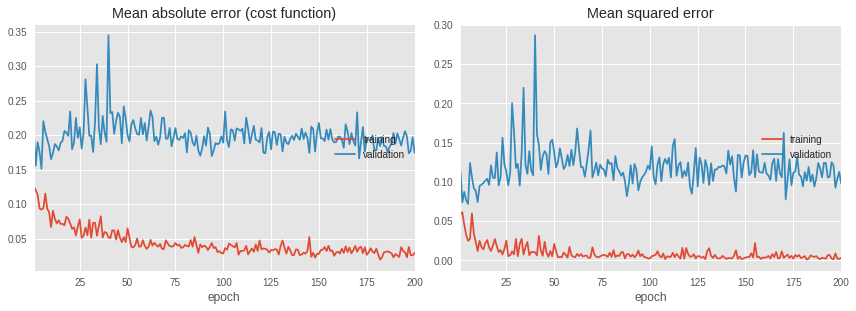

In [190]:
from keras.optimizers import adam
from keras.optimizers import SGD
from keras.optimizers import adamax
from keras.optimizers import adadelta
from keras.optimizers import RMSprop,nadam
from livelossplot import PlotLossesKeras
from google.colab import files

first_n_samples = 27
batch_size = 1
epochs = 200

# sample of series from train_enc_start to train_enc_end  
encoder_input_data = get_time_block_series(series_array, date_to_index, 
                                           train_enc_start, train_enc_end)[:first_n_samples]
encoder_input_data, encode_series_mean = transform_series_encode(encoder_input_data)

# sample of series from train_pred_start to train_pred_end 
decoder_target_data = get_time_block_series(series_array, date_to_index, 
                                            train_pred_start, train_pred_end)[:first_n_samples]
decoder_target_data = transform_series_decode(decoder_target_data, encode_series_mean)

# we append a lagged history of the target series to the input data, 
# so that we can train with teacher forcing
lagged_target_history = decoder_target_data[:,:-1,:1]
encoder_input_data = np.concatenate([encoder_input_data, lagged_target_history], axis=1)

model.compile(nadam(lr=0.001), loss='mean_absolute_error',metrics=['mse'])
history = model.fit(encoder_input_data, decoder_target_data,
                    batch_size=batch_size,
                    epochs=epochs,
                    validation_split=0.2,callbacks=([PlotLossesKeras()]))

model.save('TS_Precio_Conv1D.h5')

files.download('TS_Precio_Conv1D.h5')

In [0]:
def predict_sequence(input_sequence):

    history_sequence = input_sequence.copy()
    pred_sequence = np.zeros((1,pred_steps,1)) # initialize output (pred_steps time steps)  
    
    for i in range(pred_steps):
        
        # record next time step prediction (last time step of model output) 
        last_step_pred = model.predict(history_sequence)[0,-1,0]
        pred_sequence[0,i,0] = last_step_pred
        
        # add the next time step prediction to the history sequence
        history_sequence = np.concatenate([history_sequence, 
                                           last_step_pred.reshape(-1,1,1)], axis=1)

    return pred_sequence

In [0]:
encoder_input_data = get_time_block_series(series_array, date_to_index, val_enc_start, val_enc_end)
encoder_input_data, encode_series_mean = transform_series_encode(encoder_input_data)

decoder_target_data = get_time_block_series(series_array, date_to_index, val_pred_start, val_pred_end)
decoder_target_data = transform_series_decode(decoder_target_data, encode_series_mean)

In [0]:
def predict_and_plot(encoder_input_data, decoder_target_data, sample_ind, enc_tail_len=306):

    encode_series = encoder_input_data[sample_ind:sample_ind+1,:,:] 
    pred_series = predict_sequence(encode_series)
    
    encode_series = encode_series.reshape(-1,1)
    pred_series = pred_series.reshape(-1,1)   
    target_series = decoder_target_data[sample_ind,:,:1].reshape(-1,1) 
    
    pred_series= pred_series+encode_series_mean[sample_ind]
    pred_series= np.expm1(pred_series)
    pred_series[pred_series<0] = 0
    
    target_series= target_series+encode_series_mean[sample_ind] 
    target_series= np.expm1( target_series)
    target_series[target_series<0] = 0
    
    
    encode_series_tail = np.concatenate([encode_series[-enc_tail_len:],target_series[:1]])
    x_encode = encode_series_tail.shape[0]
    
    encode_series_tail= encode_series_tail+encode_series_mean[sample_ind]
    encode_series_tail= np.expm1(encode_series_tail)
    encode_series_tail[encode_series_tail<0] = 0
    
    plt.figure(figsize=(18,8))
    
    plt.plot(range(1,x_encode+1),encode_series_tail,color='blue')
    plt.plot(range(x_encode,x_encode+pred_steps),pred_series,color='red',linestyle='--')
    #plt.plot(range(x_encode,x_encode+pred_steps),target_series,color='orange')
    
    
    plt.title('Serie de tiempo Precio pimenton rojo + Predicciones 7 dias')
    plt.legend(['Encoding Series','Predictions',""])
    
    predicciones=pd.DataFrame(pred_series,columns=["Predicciones Precio"],index=[1,2,3,4,5,6,7])
    predicciones=round(predicciones,0)
    
    return predicciones


***********************************************************************************************************************************
                                                      PREDICCIONES PRECIO PRODUCTOS PARETO                                                
***********************************************************************************************************************************




,Predicciones Precio
1,1625.0
2,1543.0
3,1680.0
4,1584.0
5,1675.0
6,1591.0
7,1625.0


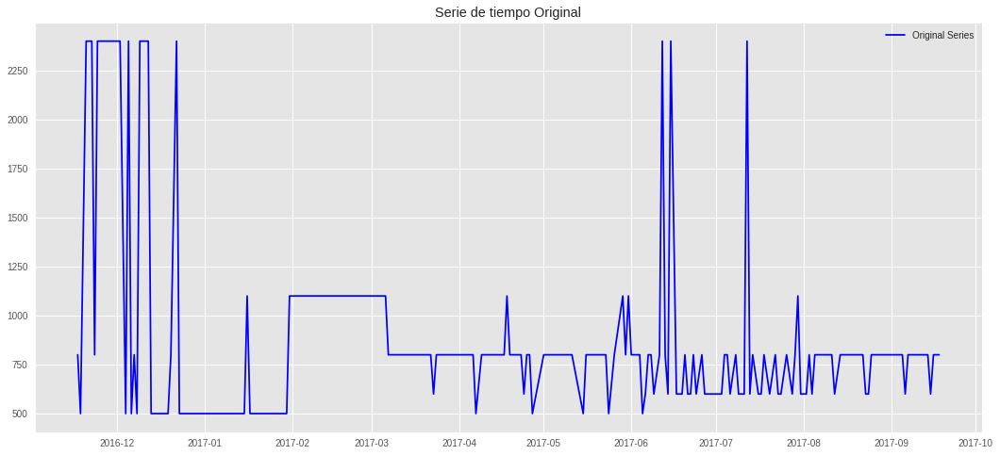

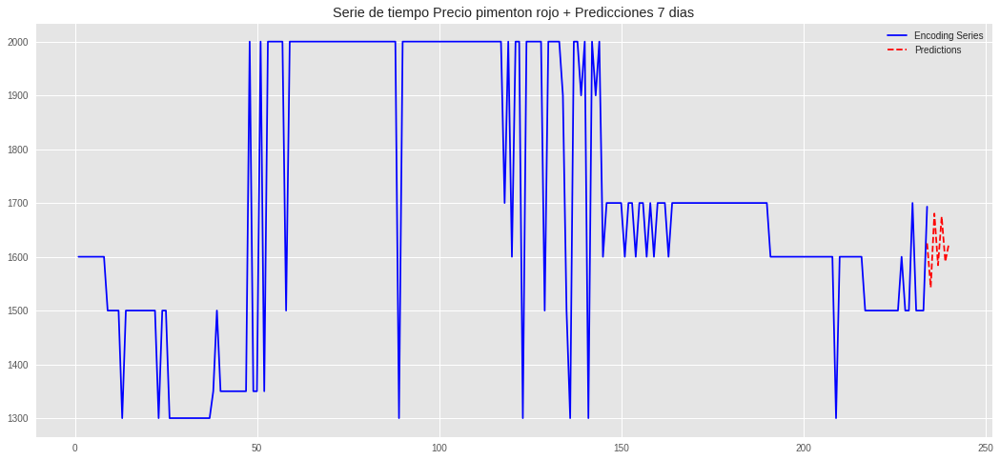

In [199]:
print("")
print("***********************************************************************************************************************************")
print("                                                      PREDICCIONES PRECIO PRODUCTOS PARETO                                                ")
print("***********************************************************************************************************************************")
print("")
plt.figure(figsize=(18,8))
plt.plot(data_Precio18.iloc[:,18:19],color='blue') 
plt.title('Serie de tiempo Original')
plt.legend(['Original Series'])
print("")
predict_and_plot(encoder_input_data, decoder_target_data,19)

In [106]:
data_Precio18.columns

Index(['Aguacate.Haas', 'Aguacate.Papelillo', 'Banano.Criollo', 'Berenjena',
       'Breva', 'BrÃ³coli', 'Cebolla.Cabezona.Blanca', 'Cebolla.Cabezona.Roja',
       'ChampiÃ.Ã³n', 'Fresa.Pareja', 'Lechuga.Crespa', 'LimÃ³n.TahitÃ.',
       'Mango.Tommy.Atkins', 'Mazorca.Desgranada', 'Mora.Castilla',
       'Papa.Criolla', 'Pepino.Cohombro', 'Perejil.Crespo', 'Perejil.Liso',
       'PimentÃ³n.Rojo', 'PiÃ.a.Golden.Sweet', 'PlÃ.tano.Maduro', 'RÃºgula',
       'Tomate.Chonto', 'Tomate.Larga.Vida', 'Zanahoria', 'Zucchini.Verde'],
      dtype='object')

In [0]:
from keras.utils import plot_model
from keras.models import load_model
from google.colab import files

import pydot
import graphviz

#model=load_model("mixNNtrained_Stack.h5")
plot_model(model,to_file='Conv1D_Demanda.png',show_shapes=True, show_layer_names=True,rankdir='TB')

files.download('Conv1D_Demanda.png')

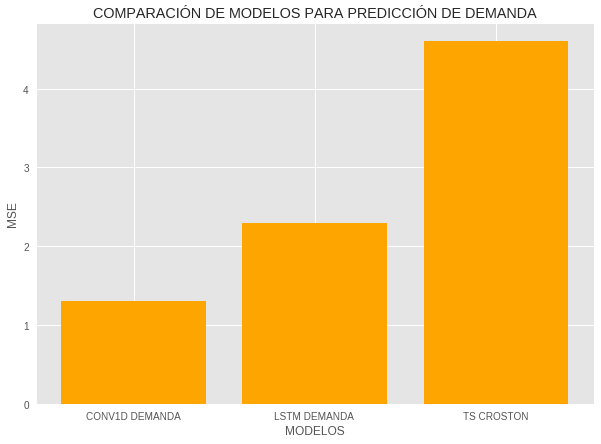

In [201]:
plt.figure(figsize=(10,7))
plt.bar(["LSTM DEMANDA ","CONV1D DEMANDA","TS CROSTON"],[2.3,1.3,4.6],color="orange",align='center')
plt.title("COMPARACIÓN DE MODELOS PARA PREDICCIÓN DE DEMANDA")
plt.xlabel("MODELOS",fontsize=12)
plt.ylabel("MSE")
plt.show()

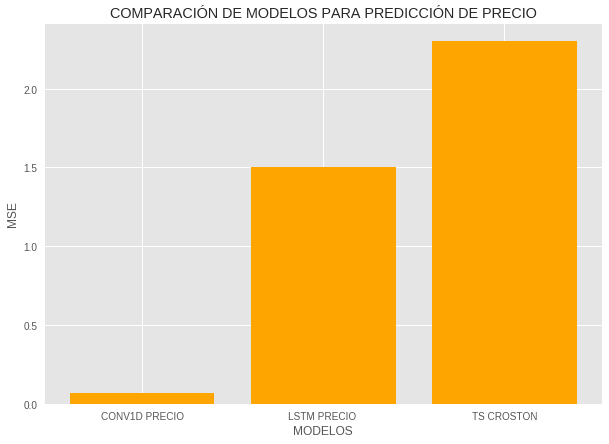

In [203]:
plt.figure(figsize=(10,7))
plt.bar(["LSTM PRECIO ","CONV1D PRECIO","TS CROSTON"],[1.5,0.07,2.3],color="orange",align='center')
plt.title("COMPARACIÓN DE MODELOS PARA PREDICCIÓN DE PRECIO")
plt.xlabel("MODELOS",fontsize=12)
plt.ylabel("MSE")
plt.show()